### Contents

 - [Load Data](#Load-Data) from wrangling step
 - [Missing Data, Data Checks](#Missing-Data,-Cleaning-Data) pt 1
   - [data removal step](#Final-Checks,-Cleaning)
 - [Target Features](#Target-Features)
 - [Feature Distributions and Relationships](#Initial-Exploration,-Intercorrelation) pt 1
 - [Feature Selection](#Feature-Selection)
   - [missing data, data checks](#Data-Cleaning-2) pt 2
     - [distributions, outliers](#)
     - [investigations](#Cleaning-Investigations)
     - [removal step](#Cleaning-Decisions)
 - [Feature Engineering](#Feature-Engineering)
   - [exploration, planning](#Exploration)
   - [feature creation, assessment](#Engineered-Features)
   - [Pillow function to reduce image size](#Reduce-image-size-of-pairplots,-marginally)
 - [Persist Final Dataset](#Save-Data,Reload-Final-Clean)
 - [Feature Importance](#Feature-Importance)
   - [SelectKBest exercise](#Feature-Selection-for-Models) for margin and win
   - [PCA exercise](#Demonstrative-PCA)
 - [Conclusion](#Conclusion)
 - [Other](#Other)
   - [plotly heatmaps](#plotly-heatmaps)

In [117]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

### Load Data

*quick historical team data demonstration. data not used for now*

In [3]:
# make directory for graphs
Path('graphs/EDA').mkdir(exist_ok=True)
Path('graphs/EDA/pairplots').mkdir(exist_ok=True) # big graphs, not uploaded to repo
Path('graphs/EDA/ydata').mkdir(exist_ok=True) # big reports, not uploaded to repo
Path('graphs/EDA/PCA').mkdir(exist_ok=True)

In [40]:
# load data
data = pd.read_parquet('data/clean_1/game_stats_2023-09-19.parquet')

In [30]:
data.sample(3).drop(columns=['tz','location']).T

,1545,2180,2284
game,2016-07-02-TOR-MTL,2014-07-26-MAD-SJ,2018-06-02-DC-PIT
date,2016-07-02 19:00:00+00:00,2014-07-26 19:00:00+00:00,2018-06-02 18:00:00+00:00
week,14,championship,10
home,Royal,Spiders,Thunderbirds
away,Rush,Radicals,Breeze
home_score,18,23,11
away_score,29,20,20
away_completions,237,265,342
away_throws,252,286,365
away_hucks_completed,-1,-1,-1


#### Historical Team Data

In [31]:
teams = pd.read_parquet('data/clean_1/team_info_2023-09-19.parquet')

In [32]:
teams.head()

,abbrev,city,name,primary,secondary,home,away,games,first,last,wins,losses,ties
36,KPS,KPS',KPS's All-Stars,<NA>,<NA>,1,0,1,2019,2019,1,0,0
35,Rowan,Rowan's,Rowan's All-Stars,<NA>,<NA>,0,1,1,2019,2019,0,1,0
37,BOS,Boston,Glory,#181440,#8D0A19,18,19,37,2021,2023,16,21,0
5,DC,DC,Breeze,#0A3751,#B7202B,73,73,146,2013,2023,89,56,1
40,SLC,Salt Lake,Shred,#00477B,#FFAA00,15,14,29,2022,2023,24,5,0


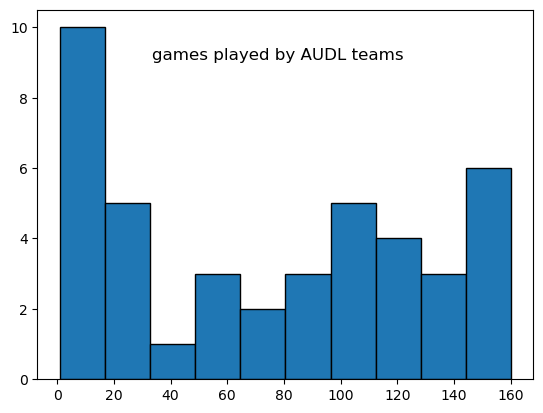

In [33]:
teams.games.hist(edgecolor='k')
plt.suptitle('games played by AUDL teams',y=0.8)
plt.grid(False)
plt.show()

In [34]:
seasons_played = teams['last'] - teams['first'] + 1

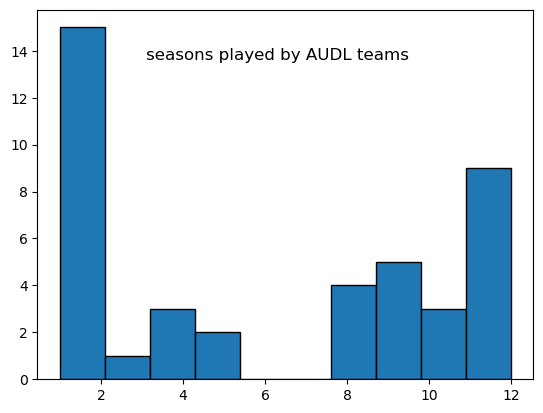

In [35]:
seasons_played.hist(edgecolor='k')
plt.suptitle('seasons played by AUDL teams',y=0.8)
plt.grid(False)
plt.show()

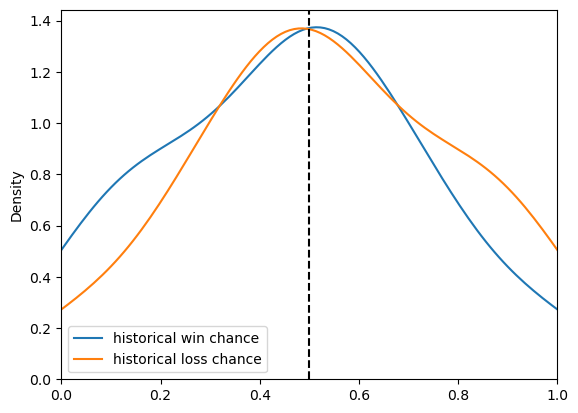

In [36]:
# historical team winning percentage
sns.kdeplot(x=np.array(teams.wins/teams.games), label='historical win chance')
sns.kdeplot(x=np.array(teams.losses/teams.games), label='historical loss chance')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])

plt.show()

In [37]:
del teams, seasons_played

### Missing Data, Cleaning Data

Assessment and cleaning. *HTML table formatting will not show up in Github*

<font color="khaki">**Data removal decisions changed after Feature Selection**</font>

**Decisions**
 - remove 2012, 2013 seasons with many features missing for lots of games
 - remove "huck" and "redzone" (rz) features which were not documented until 2021 season
   - home/away `hucks_completed`, `hucks`, `rz_scores`, `rz_possessions`
 - drop games with incomplete data
   - index: `{2182, 1514, 1516, 1709, 1752, 2109}`
 - *ignore* descriptive features that will not be used in model training
   - some will be retained in dataframe for labelling
 - **Data Checks**
   - see [section below](#Final-Checks,-Cleaning) for details

In [39]:
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2012,2013,2014,2015,2016,2017,2018,2019,2021,2022,2023
location,0,0,0,0,0,0,0,0,0,0,0
home_score,0,0,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0,0,0
away_completions,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_throws,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_hucks_completed,-64,-101,-126,-185,-193,-179,-171,-132,0,0,0
away_hucks,-64,-101,-126,-185,-193,-179,-171,-132,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0,0,0
away_o_scores,-64,-101,-1,-2,-2,0,0,0,0,0,0


In [41]:
print(data.shape)
data = data[data.date.dt.year > 2013]
print('removed 2012,2013 seasons')
print(data.shape)

(1604, 37)
removed 2012,2013 seasons
(1439, 37)


In [42]:
print(data.shape)
data.drop(columns = ['away_hucks_completed', 'away_hucks', 'away_rz_scores', 'away_rz_possessions',
                     'home_hucks_completed', 'home_hucks','home_rz_scores', 'home_rz_possessions',
                     'location', 'tz',], inplace=True)
print('after hucks, redzone, and description feature removal')
print(data.shape)

(1439, 37)
after hucks, redzone, and description feature removal
(1439, 27)


In [43]:
ind = []
for col in data.columns[7:]:
    ind.extend(data[data[col]==-1].index.values)
ind = set(ind)
print(ind)

{2182, 1514, 1516, 1709, 1752, 2109}


In [43]:
data.loc[list(ind),:]

,game,date,week,home,away,home_score,away_score,away_completions,away_throws,away_blocks,...,home_completions,home_throws,home_blocks,home_turnovers,home_o_scores,home_o_points,home_o_possessions,home_d_scores,home_d_points,home_d_possessions
2182,2014-07-27-SJ-TOR,2014-07-27 19:00:00+00:00,championship,Rush,Spiders,18,28,-1,-1,10,...,-1,-1,0,0,-1,-1,-1,-1,-1,-1
1514,2016-08-07-SEA-DAL,2016-08-07 12:00:00+00:00,championship,Legion,Cascades,33,27,-1,-1,0,...,-1,-1,12,16,22,29,34,11,35,17
1516,2016-08-06-SEA-MAD,2016-08-06 19:00:00+00:00,championship,Radicals,Cascades,25,26,-1,-1,0,...,-1,-1,11,21,18,28,32,7,27,15
1709,2015-07-25-CHI-PIT,2015-07-25 19:00:00+00:00,playoffs,Thunderbirds,Union,24,23,-1,-1,0,...,-1,-1,9,28,14,26,36,10,26,18
1752,2015-06-27-CHI-DET,2015-06-27 16:00:00+00:00,12,Mechanix,Union,11,21,-1,-1,0,...,-1,-1,11,44,10,24,51,1,13,7
2109,2014-05-18-SLC-SEA,2014-05-18 19:00:00+00:00,6,Cascades,Lions,26,13,-1,-1,0,...,-1,-1,15,27,10,15,25,16,28,30


In [44]:
print(data.shape)
data.drop(index=list(ind), inplace=True)
print('after incomplete game stats removal')
print(data.shape)

(1439, 27)
after incomplete game stats removal
(1433, 27)


In [45]:
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2014,2015,2016,2017,2018,2019,2021,2022,2023
home_score,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0
away_completions,0,0,0,0,0,0,0,0,0
away_throws,0,0,0,0,0,0,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0
away_o_scores,0,0,0,0,0,0,0,0,0
away_o_points,0,0,0,0,0,0,0,0,0
away_o_possessions,0,0,0,0,0,0,0,0,0
away_d_scores,0,0,0,0,0,0,0,0,0


In [46]:
data.where(data != -1, np.nan, inplace=True)
print(round(100*data.isnull().sum().sum()/(data.shape[0]*data.shape[1])), 'percent data missing')

0 percent data missing


#### Final Checks, Cleaning

**Checks, Bad Data**
 - **found bad data:**
   - o,d scores should add up to total for both home team and away team
   - index: `1641, 1525, 2095, 2353, 2964`
 - **seemed ok**:
   - home o,d points should be about away d,o points
   - completions should not be greater than throws
   - scores should not be greater than points
   - points should not be greater than possessions for offense
     - defense possesions/points would be valuable metric
   - home/away blocks should be should not be greater than away/home throws - completions - turnovers

In [48]:
print('Away o/d scores that do not add up (difference of greater than 4)')
data[np.abs(data.away_score - (data.away_o_scores+data.away_d_scores))>4][['away_score','away_o_scores','away_d_scores', 'game']]

Away o/d scores that do not add up (difference of greater than 4)


,away_score,away_o_scores,away_d_scores,game
1641,23,12,3,2016-05-14-CHI-MIN
1525,12,7,0,2016-07-10-RAL-AUS
2353,10,8,24,2018-07-14-DET-PIT
2964,42,17,14,2022-11-12-allstar-game


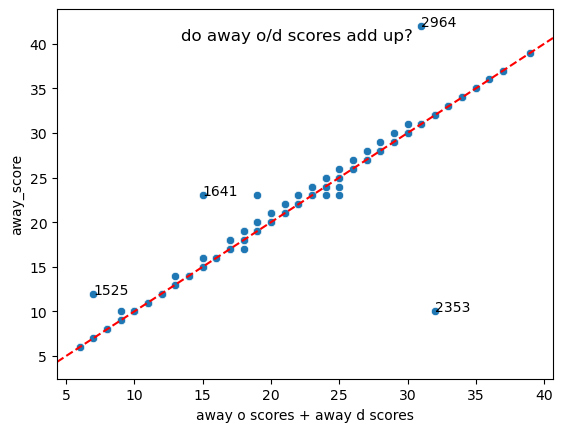

In [59]:
sns.scatterplot(x = (data.away_o_scores + data.away_d_scores), y=data.away_score)
plt.suptitle('do away o/d scores add up?', y=0.84)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('away o scores + away d scores')
for ind in data[np.abs(data.away_score - (data.away_o_scores+data.away_d_scores))>4].index:
    plt.annotate(ind, 
        (data.loc[ind,'away_o_scores']+data.loc[ind,'away_d_scores'], data.loc[ind,'away_score'])
                )
plt.show()

In [53]:
print('Home o/d scores that do not add up (difference of greater than 2)')
data[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>2][['home','home_score','home_o_scores','home_d_scores', 'game']]

Home o/d scores that do not add up (difference of greater than 2)


,home,home_score,home_o_scores,home_d_scores,game
2095,AlleyCats,25,7,0,2014-05-10-MIN-IND
3089,Spiders,25,8,14,2023-07-08-POR-OAK


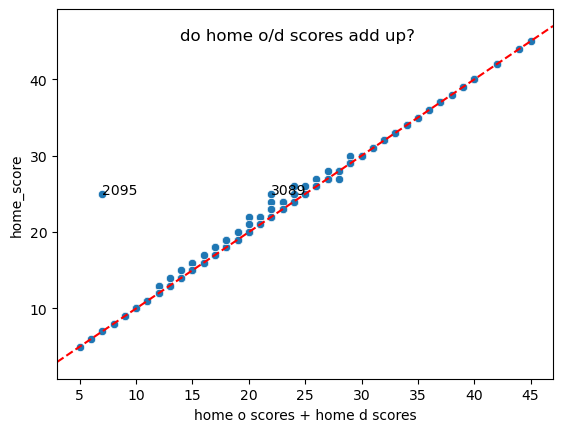

In [58]:
sns.scatterplot(x = (data.home_o_scores + data.home_d_scores), y=data.home_score)
plt.suptitle('do home o/d scores add up?', y=0.84)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('home o scores + home d scores')
for ind in data[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>2].index:
    plt.annotate(ind, 
        (data.loc[ind,'home_o_scores']+data.loc[ind,'home_d_scores'], data.loc[ind,'home_score'])
                )
plt.show()

In [63]:
data.columns[5:]

Index(['home_score', 'away_score', 'away_completions', 'away_throws',
       'away_blocks', 'away_turnovers', 'away_o_scores', 'away_o_points',
       'away_o_possessions', 'away_d_scores', 'away_d_points',
       'away_d_possessions', 'home_completions', 'home_throws', 'home_blocks',
       'home_turnovers', 'home_o_scores', 'home_o_points',
       'home_o_possessions', 'home_d_scores', 'home_d_points',
       'home_d_possessions'],
      dtype='object')

**Handy test cell. Following cells are single plots for demonstration**

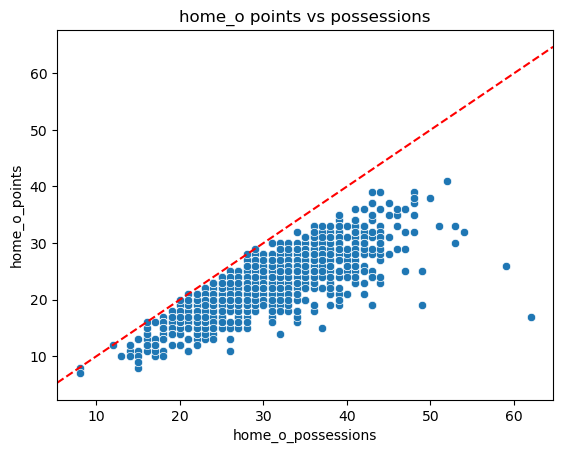

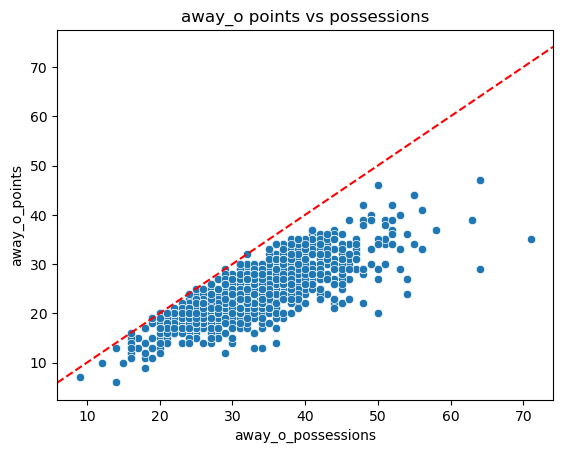

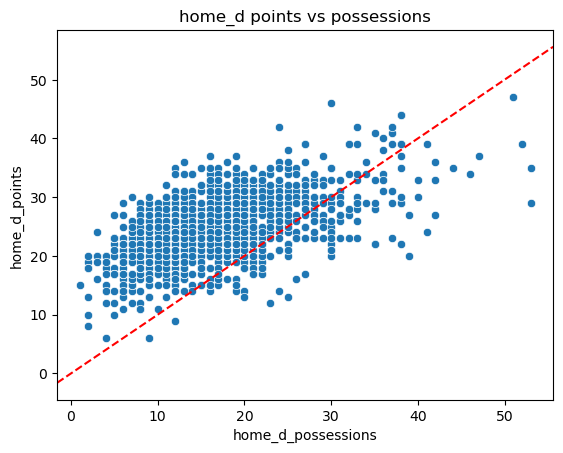

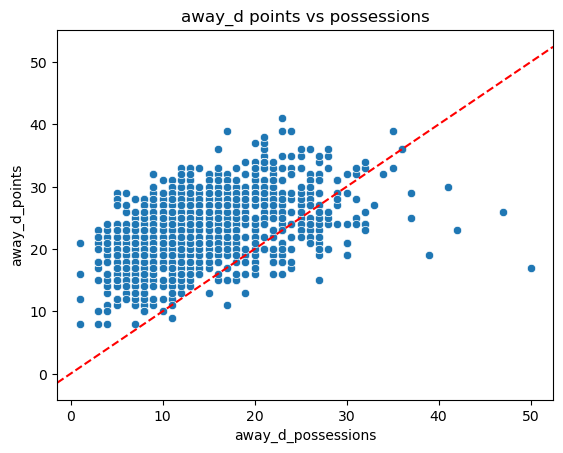

In [61]:
col1 = 'possessions' # points
col2 = 'points' # scores

for val2 in ['o','d']:
    for val1 in ['home','away']:
        sns.scatterplot(x = data[f"{val1}_{val2}_{col1}"], y=data[f"{val1}_{val2}_{col2}"])
        xlim = plt.xlim()
        plt.plot(xlim,xlim, 'r--')
        plt.xlim(xlim)
        plt.title(f"{val1}_{val2} {col2} vs {col1}")
        plt.show()

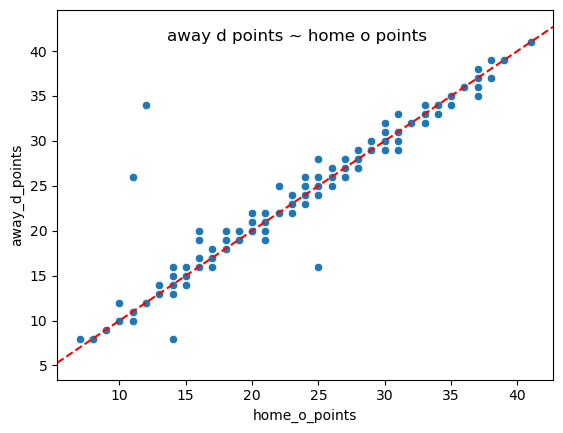

In [65]:
sns.scatterplot(x = data.home_o_points, y=data.away_d_points)
plt.suptitle('away d points ~ home o points', y=0.84)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.show()

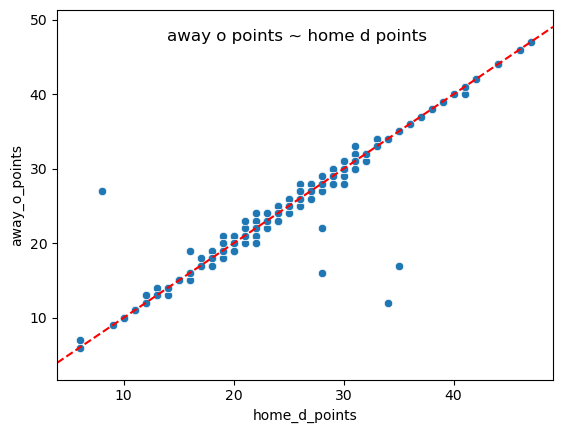

In [67]:
sns.scatterplot(x = data.home_d_points, y=data.away_o_points)
plt.suptitle('away o points ~ home d points', y=0.84)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.show()

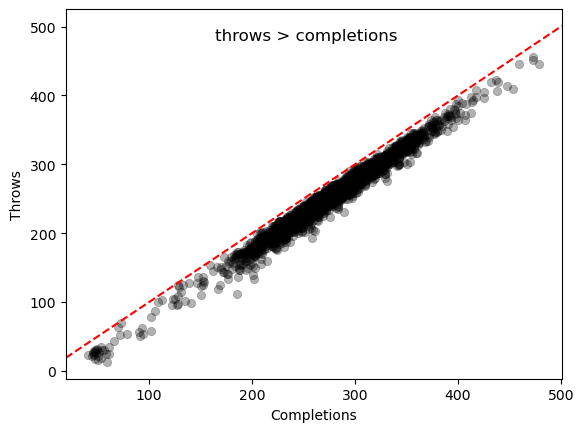

In [46]:
sns.scatterplot(x = data.home_throws, y=data.home_completions, alpha=0.3, color='k', edgecolor='face')
sns.scatterplot(x = data.away_throws, y=data.away_completions, alpha=0.3, color='k', edgecolor='face')
plt.suptitle('throws > completions', y=0.84)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('Completions')
plt.ylabel('Throws')
plt.show()

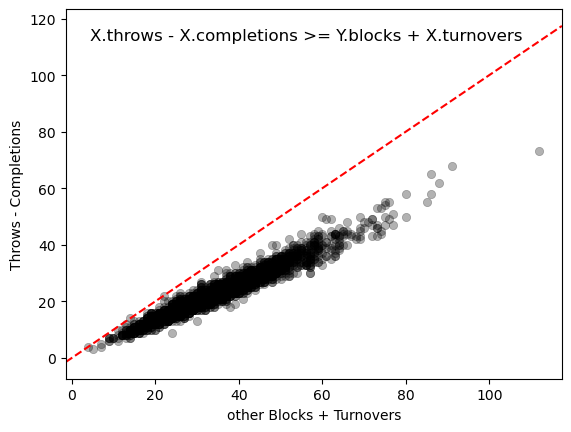

In [86]:
sns.scatterplot(x = data.away_blocks + data.home_turnovers, y=data.home_throws-data.home_completions,
                alpha=0.3, color='k', edgecolor='face')
sns.scatterplot(x = data.home_blocks + data.away_turnovers, y=data.away_throws-data.away_completions,
                alpha=0.3, color='k', edgecolor='face')
plt.suptitle('X.throws - X.completions >= Y.blocks + X.turnovers', y=0.84)
#plt.suptitle('', y=0.82)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('other Blocks + Turnovers')
plt.ylabel('Throws - Completions')
plt.show()

#### Remove Bad Data
index = `[1641, 1525, 2353, 2964, 2095]`

In [7]:
bad_data_ind = data[np.abs(data.away_score - (data.away_o_scores+data.away_d_scores))>4].index.to_list()
bad_data_ind.extend(data[np.abs(data.home_score - (data.home_o_scores+data.home_d_scores))>3].index.to_list())
bad_data_ind

[1641, 1525, 2353, 2964, 2095]

In [89]:
data.loc[bad_data_ind,:]

,game,date,week,home,away,home_score,away_score,away_completions,away_throws,away_blocks,...,home_completions,home_throws,home_blocks,home_turnovers,home_o_scores,home_o_points,home_o_possessions,home_d_scores,home_d_points,home_d_possessions
1641,2016-05-14-CHI-MIN,2016-05-14 19:00:00+00:00,7,Wind Chill,Union,26,23,173,186,3,...,258,280,17,22,19,25,31,7,28,20
1525,2016-07-10-RAL-AUS,2016-07-10 12:30:00+00:00,15,Sol,Flyers,33,12,104,125,8,...,267,296,20,29,13,14,19,20,35,44
2353,2018-07-14-DET-PIT,2018-07-14 18:00:00+00:00,16,Thunderbirds,Mechanix,32,10,190,209,20,...,190,208,20,18,8,12,20,24,34,32
2964,2022-11-12-allstar-game,2022-11-12 16:00:00+00:00,allstars,SW All-Stars,EC All-Stars,24,42,241,262,18,...,264,294,12,30,19,34,41,4,23,12
2095,2014-05-10-MIN-IND,2014-05-10 19:00:00+00:00,5,AlleyCats,Wind Chill,25,24,367,389,15,...,100,109,0,9,7,11,15,0,8,2


In [8]:
print(data.shape)
data.drop(index=bad_data_ind,inplace=True)
print('removed games with bogus scores data')
print(data.shape)

(1433, 27)
removed games with bogus scores data
(1428, 27)


### Target Features
 - Thoughts
   - considering each game from a particular team's (`OAK` or `DET`) perspective will invovle extra effort in separating home/away to avoid double-counting
   - will treat whole dataset as team agnostic for now, and create target features from the **home** team's perspective
     - this is how the statistics were recorded
 - Target Features for Models
   - **Home Margin**: `<home-score> - <away-score>`
     - final point differential, target for **regression** models
       - positives indicates wins, negatives are losses, and zeroes are ties
   - **Home Win**: `True` if `<home-score> > <away-score>`
     - final outcome, target for **logistic regression/classification** models
     - ties not considered wins for now
 - target features created and briefly explored below

In [9]:
data.loc[:,'home_win'] = data.home_score > data.away_score
data.loc[:,'home_margin'] = data.home_score - data.away_score

**Win**
 - home team advantage?

In [92]:
print(round(100*data.home_win.mean(),1), 'percent home victories')

57.9 percent home victories


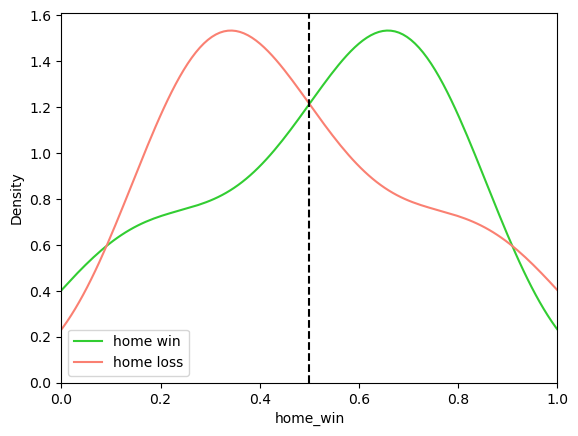

In [93]:
sns.kdeplot(x=data.groupby('home')['home_win'].mean(), label='home win', color='limegreen')
sns.kdeplot(x=1-data.groupby('home')['home_win'].mean(), label='home loss', color='salmon')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])
plt.show()

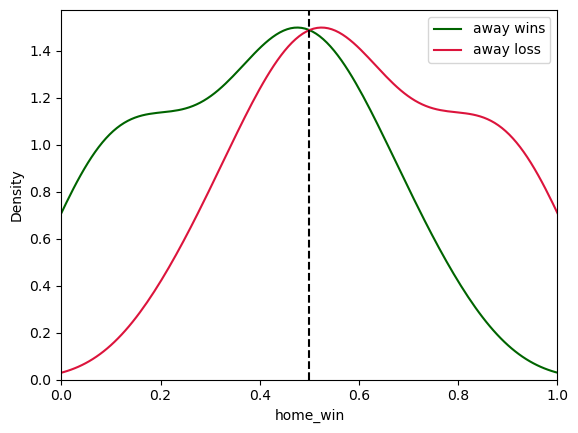

In [94]:
sns.kdeplot(x=1-data.groupby('away')['home_win'].mean(), label='away wins', color='darkgreen')
sns.kdeplot(x=data.groupby('away')['home_win'].mean(), label='away loss', color='crimson')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])
plt.show()

**Margin**
 - very few 0 values (ties) due to game design, overtime
 - greater home wins skews margin positive
   - absolute margins show symmetry, games much more likely to be close (low margin)

In [109]:
print('lowest home margins, Mechanix :(')
data.sort_values('home_margin').head()[['date','home_margin','home','home_score','away','away_score']]


lowest home margins, Mechanix :(


,date,home_margin,home,home_score,away,away_score
2068,2014-04-19 19:00:00+00:00,-25,Mechanix,9,Radicals,34
2674,2021-06-05 18:00:00+00:00,-24,Mechanix,10,Radicals,34
1885,2015-04-11 18:30:00+00:00,-20,Breeze,17,Rush,37
1483,2017-04-29 18:00:00+00:00,-19,Nightwatch,8,Legion,27
3079,2023-06-09 19:30:00+00:00,-18,Nitro,11,Aviators,29


In [110]:
print('highest home margins, Mechanix :(')
data.sort_values('home_margin', ascending=False).head()[['date','home_margin','home','home_score','away','away_score']]


highest home margins, Mechanix :(


,date,home_margin,home,home_score,away,away_score
1725,2015-07-17 19:00:00+00:00,34,Wind Chill,45,Mechanix,11
2258,2018-05-13 12:00:00+00:00,29,Radicals,37,Mechanix,8
2132,2014-06-07 19:00:00+00:00,28,Riptide,37,Lions,9
2157,2014-06-27 19:00:00+00:00,26,Wind Chill,42,Mechanix,16
1739,2015-07-10 19:00:00+00:00,26,Thunderbirds,42,Mechanix,16


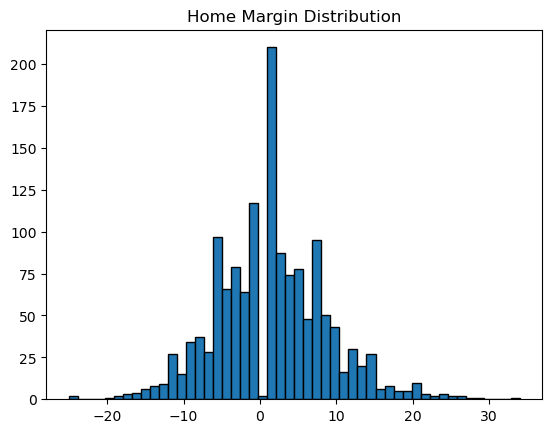

In [95]:
data['home_margin'].hist(edgecolor='k', bins=50)
plt.title('Home Margin Distribution')
plt.grid(False)
plt.show()

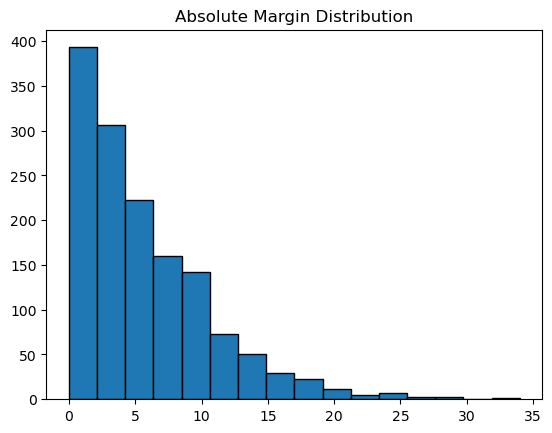

In [107]:
data['home_margin'].abs().hist(edgecolor='k',bins=16)
plt.title('Absolute Margin Distribution')
plt.grid(False)
plt.show()

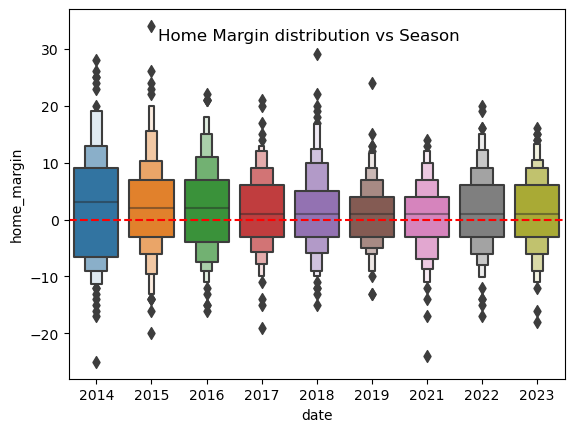

In [116]:
sns.boxenplot(data, y='home_margin', x=data.date.dt.year)
xlim = plt.xlim()
plt.plot(xlim, [0,0], 'r--')
plt.xlim(xlim)
plt.suptitle('Home Margin distribution vs Season', y=0.84)
plt.show()

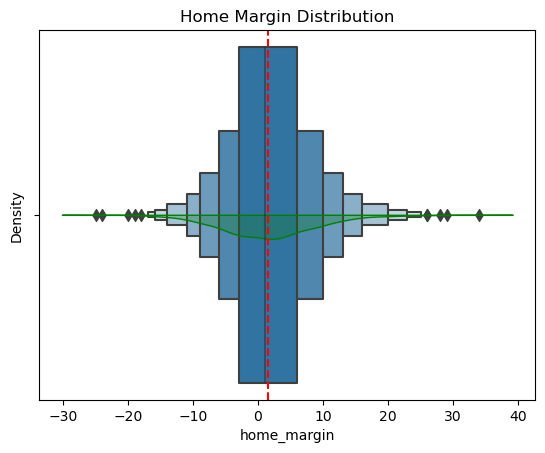

In [118]:
sns.boxenplot(x=data.home_margin)
sns.kdeplot(data.home_margin, color='g', fill=True)
plt.title('Home Margin Distribution')
plt.axvline(x=data.home_margin.mean(), c='r', linestyle='--')
plt.show()

#### Correlation Tables for Target Features
 - `d_scores` most prominent feature, these are "breaks" in a frisbee game and become more significant at higher levels of play
   - interestingly `o_scores` has little relation on its own, and could maybe be combined with `o_points` to provide utility
 - `o_points` and `d_points` are direct results of which team scores the previous point, there they are also highly correlated to targets
 - possessions follow similar logic, as they are only possible when a team's "o" or "d" is on the field
   - more possessions on points for "o" means more chances for the opposing team to break
   - more possesions on points for "d" means giving your team more chances to break, at a certain point much more possesions than points may indicate inefficient conversion of break opportunities
 - blocks and turnovers are more direct statistics, in that they do not logically result to/from score, which have tangible correlation to target variables
 - throws and completions are also direct statistics, but they have almost no correlation to targets, can engineering improve their predictive power?

In [126]:
# Correlation Table for target features
data.corr(numeric_only=True).iloc[-2:,:-2].T.style\
        .background_gradient(cmap = 'PiYG', vmin=-1,vmax=1)\
        .format(formatter="{:.3f}")

,home_win,home_margin
home_score,0.558,0.726
away_score,-0.529,-0.685
away_completions,-0.033,-0.024
away_throws,0.024,0.060
away_blocks,-0.404,-0.440
away_turnovers,0.361,0.529
away_o_scores,-0.054,-0.132
away_o_points,0.551,0.717
away_o_possessions,0.520,0.705
away_d_scores,-0.688,-0.830


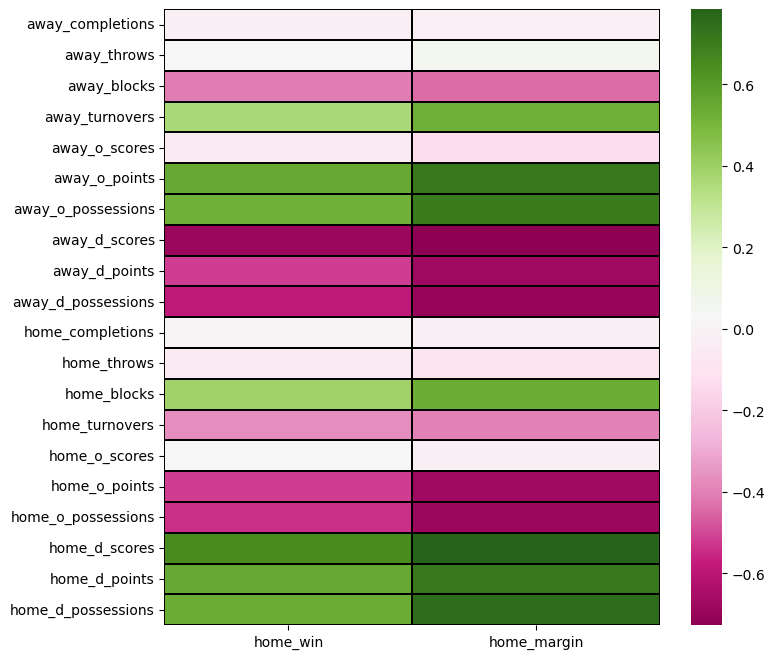

In [121]:
plt.figure(figsize=(8,8))
sns.heatmap(data.corr(numeric_only=True).iloc[-2:,2:-2].T, cmap = 'PiYG',
           linecolor='k', linewidths=0.2, robust=True)
plt.show()

### Initial Exploration, Intercorrelation
- saved graphs, *see images in repository. code checks may take time to execute*
  - Data Distributions (histograms) overlaid with Linear/Logistic Regressions to Targets
    - LinReg for margin, LogReg for win
  - Pair Plots
- not used for presentation
  - Joint-Plot Explorer

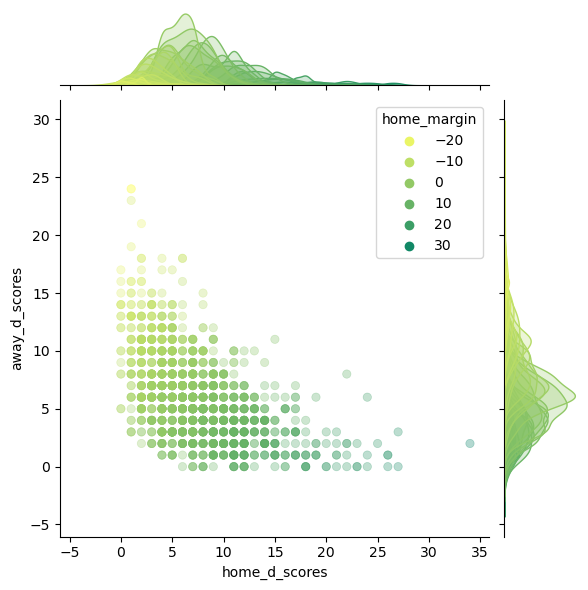

In [132]:
col1 = 'home_d_scores'
col2= 'away_d_scores'
sns.jointplot(data, x=col1, y=col2, hue='home_margin', palette='summer_r', edgecolor='face', alpha=0.3)
plt.show()

**Histograms, Regressions**

*talk about them and some basic findings*

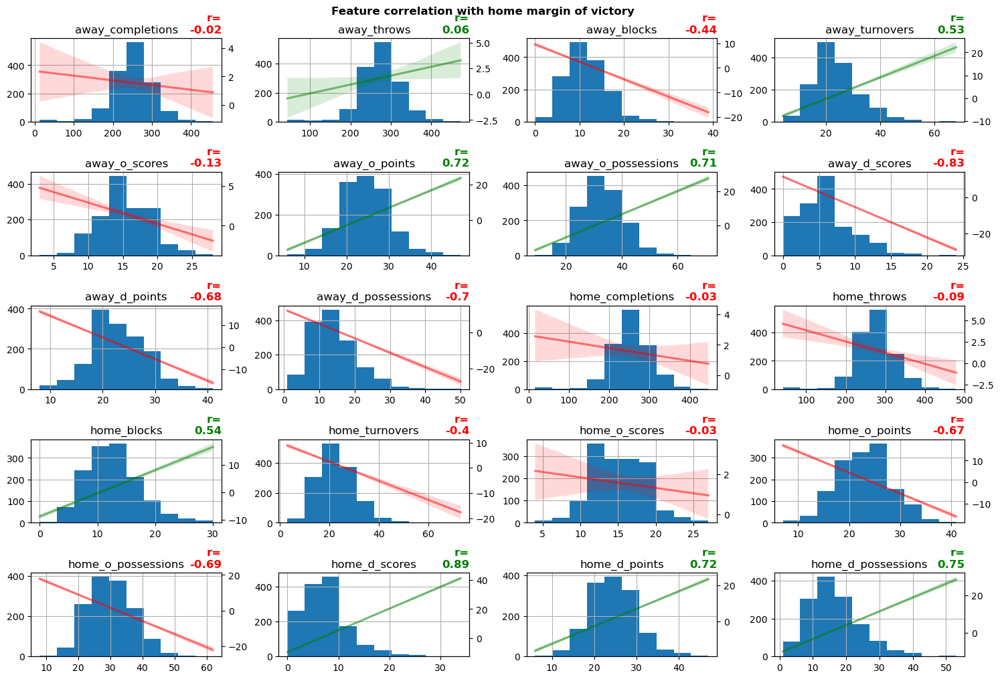

CPU times: total: 31.7 s
Wall time: 8.99 s


In [134]:

%%time

# all numerical feature except score
# distributions, reg fit vs home margin
x = data.iloc[:,7:-2].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            pearson = data[[param,'home_margin']].corr().iloc[0,1]
            # indicate positive / negative relationship with green / red
            c = 'g' if pearson > 0 else 'r' 
            sns.regplot(data, x=param, y='home_margin', scatter=False,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5))
            plt.title(f'r=\n{round(pearson,2)}', fontweight='bold', loc='right', color=c)
            plt.ylabel('')
plt.suptitle('Feature correlation with home margin of victory', y=0.92, fontweight='bold')
# plt.savefig(Path('graphs/EDA/basic_features_hist_vs_margin.png'), dpi=300, bbox_inches='tight')
plt.show()

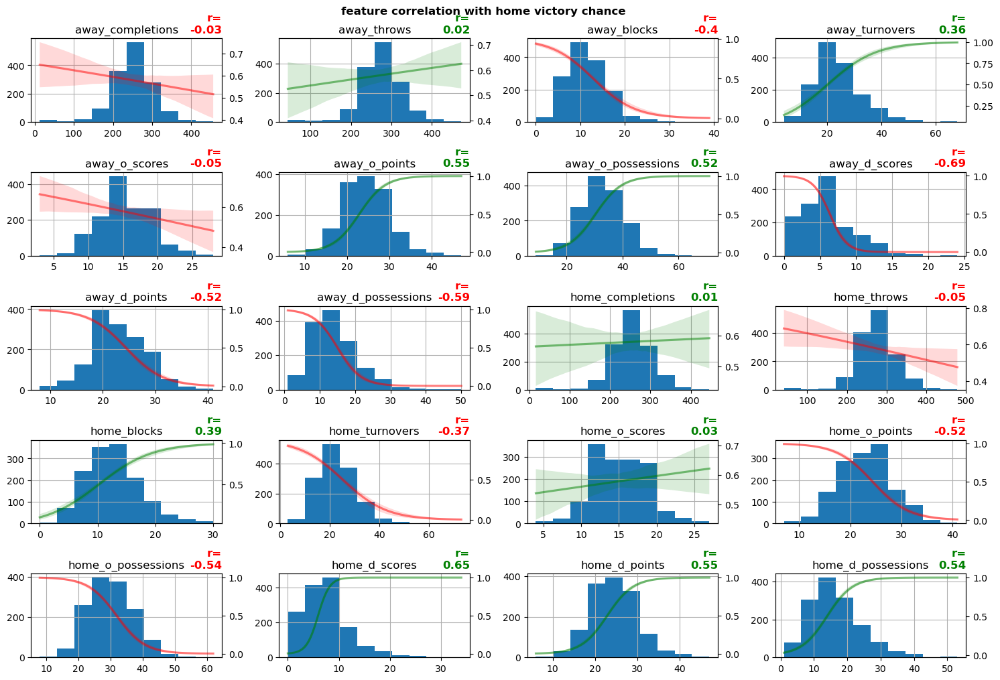

CPU times: total: 2min
Wall time: 28.6 s


In [135]:
%%time
# all numerical feature except score
# distributions, reg fit vs home margin
# can adjust n_boot (default 1000) to decrease plotting time
# ex: try 250 for speed up
x = data.iloc[:,7:-2].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            pearson = data[[param,'home_win']].corr().iloc[0,1]
            # indicate positive / negative relationship with green / red
            c = 'g' if pearson > 0 else 'r' 
            sns.regplot(data, x=param, y='home_win', scatter=False, logistic=True,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5), n_boot=250)
            plt.ylabel('')
            plt.title(f'r=\n{round(pearson,2)}', fontweight='bold', loc='right', color=c)
plt.suptitle('feature correlation with home victory chance', y=0.92, fontweight='bold')
# plt.savefig(Path('graphs/EDA/basic_features_hist_vs_win.png'), dpi=300, bbox_inches='tight')
plt.show()

**Correlation Heatmap**

 - Quick Notes
   - notice strong positive correlation between `home_o_scores` and `away_d_points`. with the exception of quarter ends, the latter event directly follows the former. therefore both features should not be kept for final model training.
     - however, `away_d_points` will be used in engineered features, such as `away_d_conversion`
     - with what frequency did the away team score when they were on defense
   - similar case for `home_d_possessions` vs `away_blocks`
   - these are the things to look for in preprocessing!

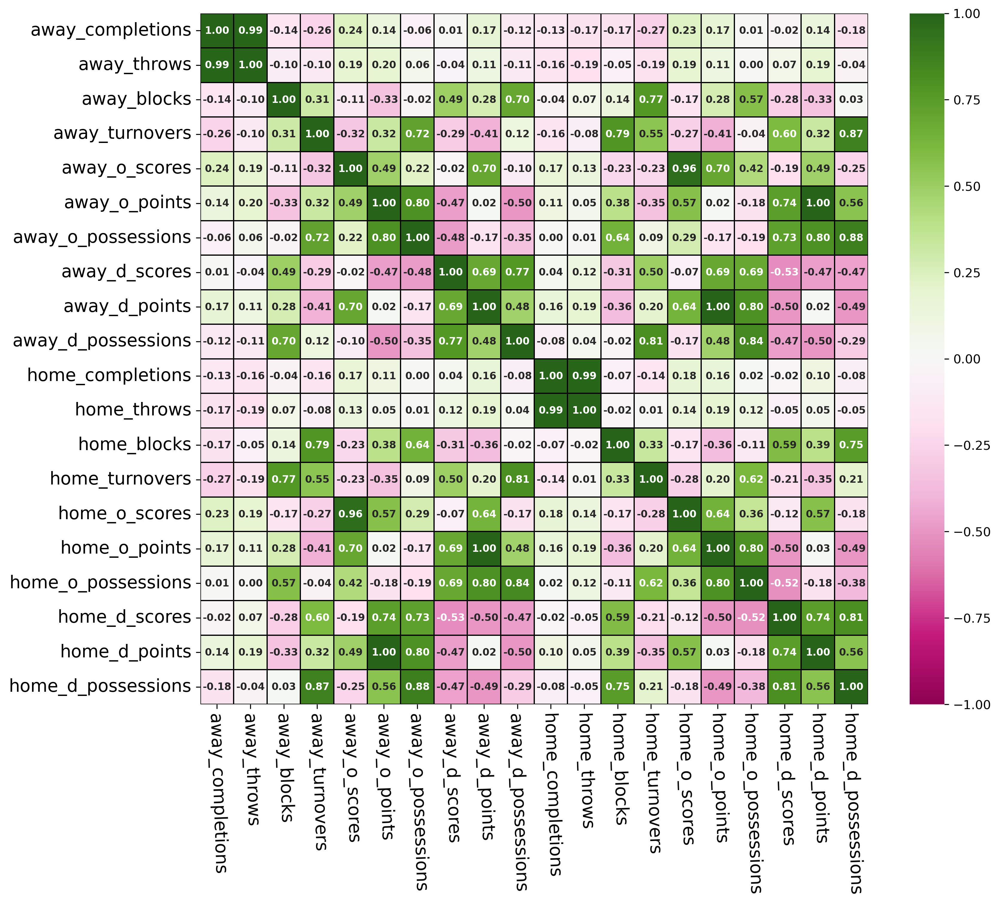

CPU times: total: 1.92 s
Wall time: 1.94 s


In [133]:
%%time

# basic feature correlation heat map
fig = plt.figure(figsize=(12,10), dpi=300)
sns.heatmap(data.iloc[:,7:27].corr(), cmap='PiYG', linecolor='k', linewidths=0.5,
           vmin=-1, vmax=1,yticklabels=True, xticklabels=True, fmt=".2f",
           annot=True, annot_kws=dict(fontsize=8,fontweight='bold'))
plt.tick_params(axis='x',labelrotation=-88)
plt.tick_params(axis='both',labelsize=14)
# plt.savefig(Path('graphs/EDA/basic_features_corr_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

**Pairplots**

*see image in repository for reviewing, times shown for executing cells below*

In [136]:
data.columns[5:27]

Index(['home_score', 'away_score', 'away_completions', 'away_throws',
       'away_blocks', 'away_turnovers', 'away_o_scores', 'away_o_points',
       'away_o_possessions', 'away_d_scores', 'away_d_points',
       'away_d_possessions', 'home_completions', 'home_throws', 'home_blocks',
       'home_turnovers', 'home_o_scores', 'home_o_points',
       'home_o_possessions', 'home_d_scores', 'home_d_points',
       'home_d_possessions'],
      dtype='object')

C:\Users\Nish\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 3600x3000 with 0 Axes>

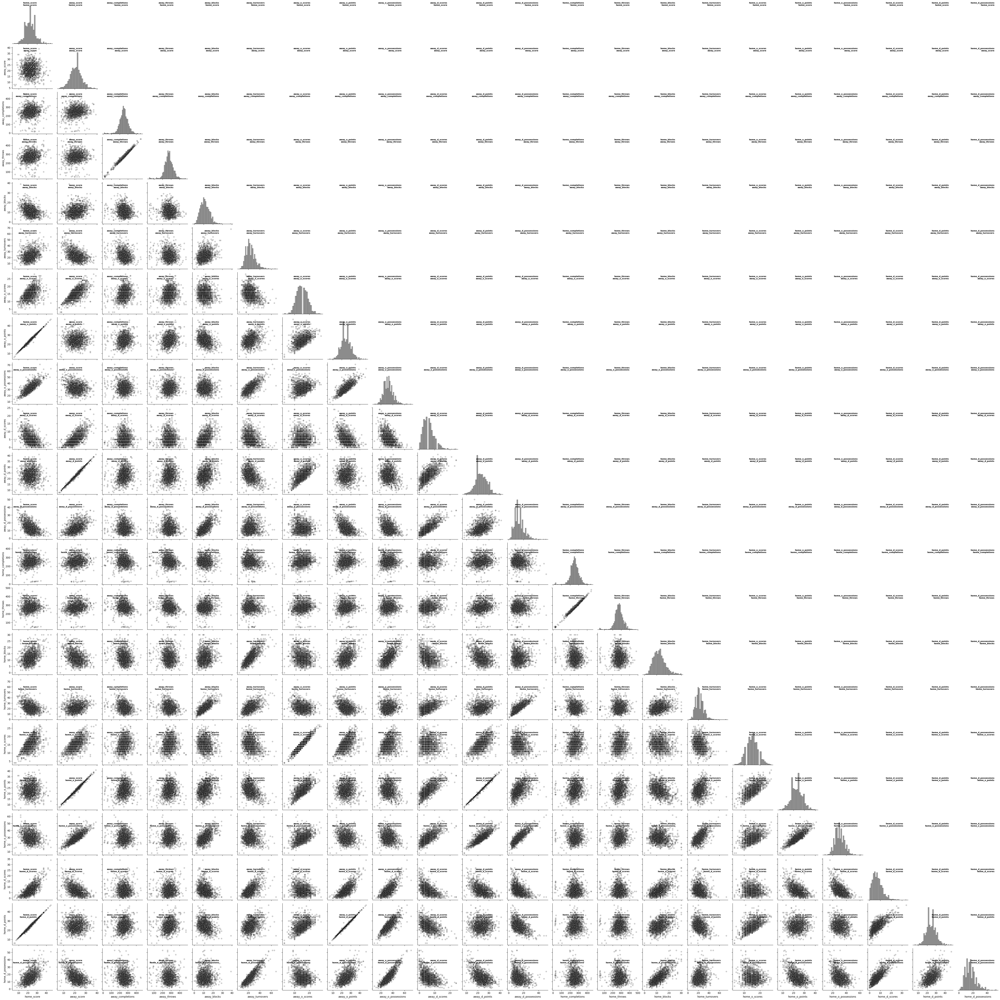

CPU times: total: 1min 21s
Wall time: 1min 21s


In [137]:
%%time
# basic feature pair plots, 20s to do columns 9:15
# columns 9:37, corner=True, figsize(12,10), dpi=300, takes > 8 mins 

# adjust column range as needed
i1=5 
i2=-2

# info for labels
cols = data.columns[i1:i2]
ylabels = list(cols)
ylabels.reverse()

# pairplot
fig = plt.figure(figsize=(12,10), dpi=300)
sns.pairplot(data.iloc[:,i1:i2], corner=True,
             plot_kws=dict(color='k', alpha=0.2),
             diag_kws=dict(color='grey'))

# positions for labels
xl = np.linspace(1/len(cols), .985, len(cols))
yl = np.linspace(1/(len(cols)), .985, len(cols))

# add labels
for x,x_lab in zip(xl,cols):
    for y,y_lab in zip(yl, ylabels):
        plt.gcf().text(x,y,f'{x_lab}\n{y_lab}', fontweight='bold', ha='right',
                      fontsize=8,)

# plt.savefig(Path('graphs/EDA/pairplots/basic_features_PAIRPLOT.png'), dpi=300, bbox_inches='tight')
plt.show()

add notes

### Feature Selection

**Project Scope Limitations**

The initial modeling effort for this project will be a score difference/win prediction model based on simple statistics. 
Therefore, the features will be limited to those that can be tracked live, and are not a direct result of the previous goal in the game:
*home/away* `throws, completions, turnovers, blocks`.

The other features may be used later to assess variations in team's winning/losing methods. 
For those assessments, a simple score/win model will be useful for comparison. 
Lastly, it should be noted that a games score can be determined heuristically from the dropped features, and therefore
a regression model would not provide additional value.


**Future Ideas**

 - make a separate model to see the contribution of dropped features to various teams' performances
 - group each team by each season to create test cases for teams
 - extract play-by-play data using the other API mentioned in the Data Wrangling notebook to assess individual players

**Steps before Feature Engineering**
 - redo data cleaning
   - two entire seasons, 2012 and 2013, were dropped previously based on missing features that have been dropped . . . 
   - previously performed data checks that are still applicable to the retained features are worth doing again
     - add some more checks, as statistics seemed less consistent in the early seasons!

In [2]:
# (re)load data
data = pd.read_parquet('data/clean_1/game_stats_2023-09-19.parquet')

data.loc[:,'home_win'] = data.home_score > data.away_score
data.loc[:,'home_margin'] = data.home_score - data.away_score

In [3]:
keep_cols = ['game','date','home','away','home_score','away_score']

for val in ['completions','throws','blocks','turnovers']:
    keep_cols.append(f'home_{val}')
    keep_cols.append(f'away_{val}')

keep_cols.extend(['home_win','home_margin'])

keep_cols

['game',
 'date',
 'home',
 'away',
 'home_score',
 'away_score',
 'home_completions',
 'away_completions',
 'home_throws',
 'away_throws',
 'home_blocks',
 'away_blocks',
 'home_turnovers',
 'away_turnovers',
 'home_win',
 'home_margin']

In [4]:
data[keep_cols].sample(3).T

,1355,1466,2878
game,2017-07-22-NY-OTT,2017-05-06-TOR-OTT,2022-07-09-DET-PIT
date,2017-07-22 18:00:00+00:00,2017-05-06 16:00:00+00:00,2022-07-09 18:00:00+00:00
home,Outlaws,Outlaws,Thunderbirds
away,Empire,Rush,Mechanix
home_score,25,21,22
away_score,29,24,19
home_completions,270,165,266
away_completions,213,235,241
home_throws,293,200,282
away_throws,232,265,259


### Data Cleaning 2

#### Missing Data

In [5]:
data = data[keep_cols]
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2012,2013,2014,2015,2016,2017,2018,2019,2021,2022,2023
home_score,0,0,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0,0,0
home_completions,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_completions,-34,-17,-2,-2,-2,0,0,0,0,0,0
home_throws,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_throws,-34,-17,-2,-2,-2,0,0,0,0,0,0
home_blocks,0,0,0,0,0,0,0,0,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0,0,0
home_turnovers,0,0,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0,0,0


In [16]:
data.columns[6:-2]

Index(['home_completions', 'away_completions', 'home_throws', 'away_throws',
       'home_blocks', 'away_blocks', 'home_turnovers', 'away_turnovers'],
      dtype='object')

In [6]:
ind = []
for col in data.columns[6:-2]:
    ind.extend(data[data[col]==-1].index.values)
ind = set(ind)
print(ind)

{2048, 1921, 1922, 2051, 2050, 1925, 2182, 1927, 1929, 1930, 1932, 1934, 1936, 1937, 1938, 1939, 1941, 1942, 1949, 1950, 1951, 1954, 2044, 1709, 1966, 1976, 2109, 1985, 1990, 1991, 1996, 2000, 2003, 2004, 1752, 1891, 1894, 1895, 1898, 1514, 1516, 1901, 1903, 2032, 1905, 1907, 1908, 1909, 1910, 1911, 2037, 1913, 1914, 1915, 2036, 2046, 1919}


In [54]:
data.loc[list(ind),:][data.loc[list(ind),:]==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2012,2013,2014,2015,2016
home_score,0,0,0,0,0
away_score,0,0,0,0,0
home_completions,-34,-17,-2,-2,-2
away_completions,-34,-17,-2,-2,-2
home_throws,-34,-17,-2,-2,-2
away_throws,-34,-17,-2,-2,-2
home_blocks,0,0,0,0,0
away_blocks,0,0,0,0,0
home_turnovers,0,0,0,0,0
away_turnovers,0,0,0,0,0


In [7]:
data.drop(index=list(ind), inplace=True)

In [8]:
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2012,2013,2014,2015,2016,2017,2018,2019,2021,2022,2023
home_score,0,0,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0,0,0
home_completions,0,0,0,0,0,0,0,0,0,0,0
away_completions,0,0,0,0,0,0,0,0,0,0,0
home_throws,0,0,0,0,0,0,0,0,0,0,0
away_throws,0,0,0,0,0,0,0,0,0,0,0
home_blocks,0,0,0,0,0,0,0,0,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0,0,0
home_turnovers,0,0,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0,0,0


*All missing data removed, home margin can be = -1*

#### Distributions
- use graphs to determine where to look for outliers

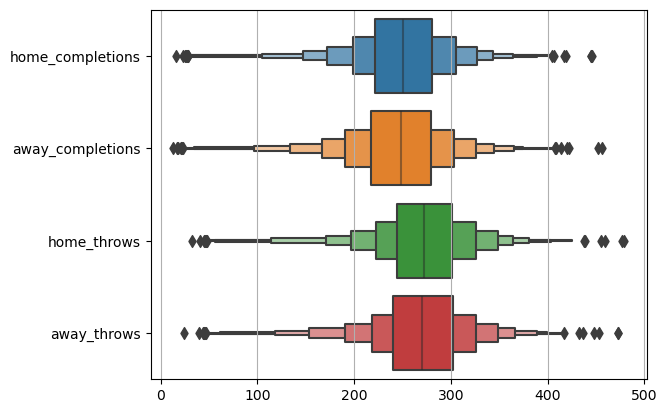

In [58]:
sns.boxenplot(data.iloc[:,6:10], orient='h')
#plt.xscale('log')
ylim = plt.ylim()
plt.grid(axis='x')
plt.show()

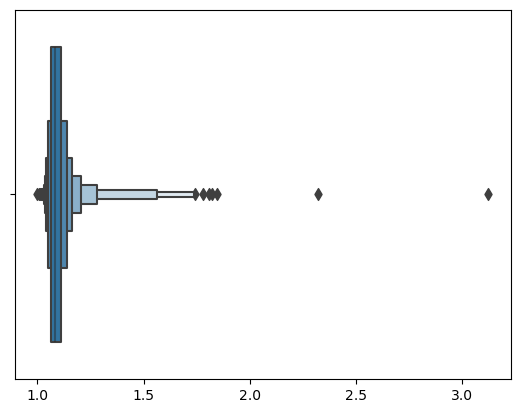

In [104]:
sns.boxenplot(x=data.home_throws/data.home_completions)
plt.show()

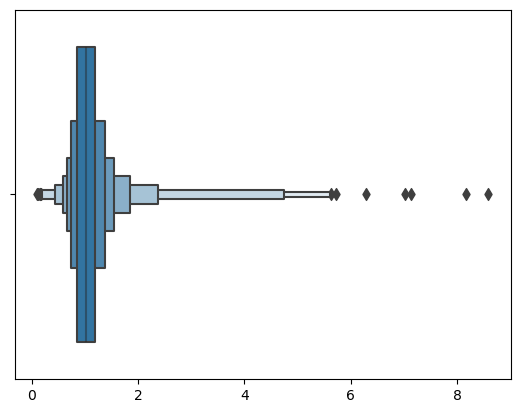

In [118]:
sns.boxenplot(x=data.home_throws/data.away_throws)
#plt.xscale('log')
plt.show()

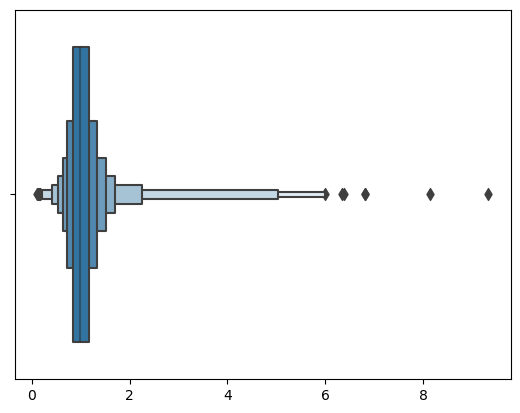

In [119]:
sns.boxenplot(x=data.away_throws/data.home_throws)
#plt.xscale('log')
plt.show()

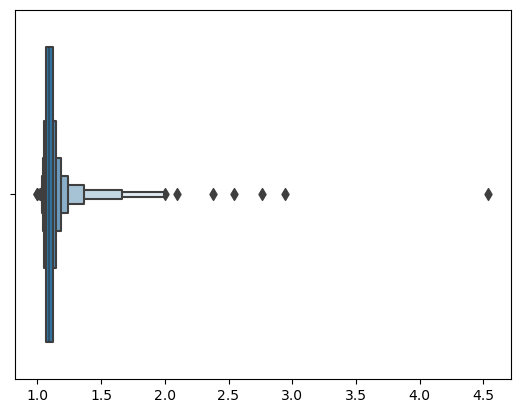

In [103]:
sns.boxenplot(x=data.away_throws/data.away_completions)
plt.show()

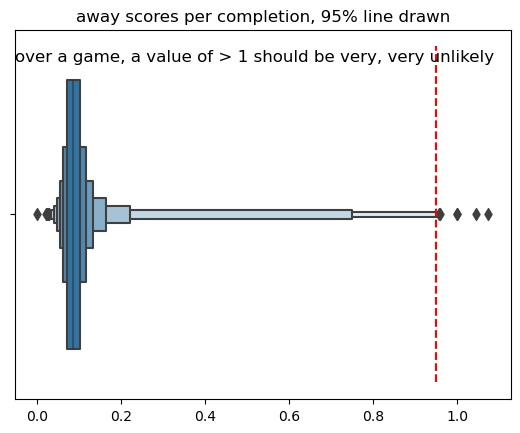

In [141]:
sns.boxenplot(x=data.away_score/data.away_completions)
plt.plot([0.95,0.95], plt.ylim(),'r--')
plt.title('away scores per completion, 95% line drawn')
plt.suptitle('over a game, a value of > 1 should be very, very unlikely', y=0.84)
plt.show()

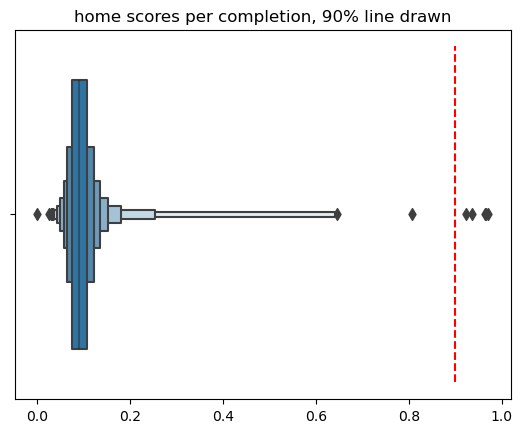

In [138]:
sns.boxenplot(x=data.home_score/data.home_completions)
plt.title('home scores per completion, 90% line drawn')
plt.plot([0.9,0.9], plt.ylim(),'r--')
plt.show()

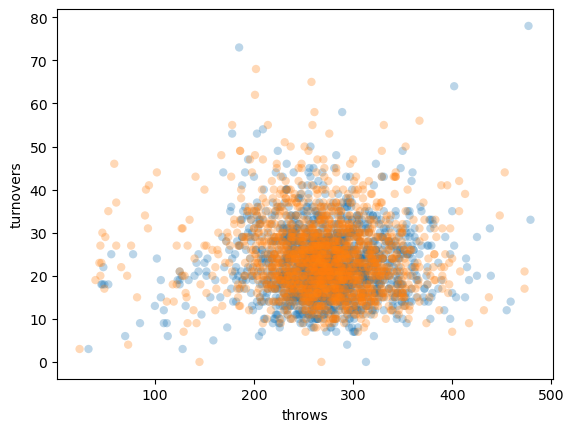

In [21]:
sns.scatterplot(data, x='home_throws', y='home_turnovers', alpha=0.3, edgecolor='none')
sns.scatterplot(data, x='away_throws', y='away_turnovers', alpha=0.3, edgecolor='none')
plt.ylabel('turnovers')
plt.xlabel('throws')
plt.show()

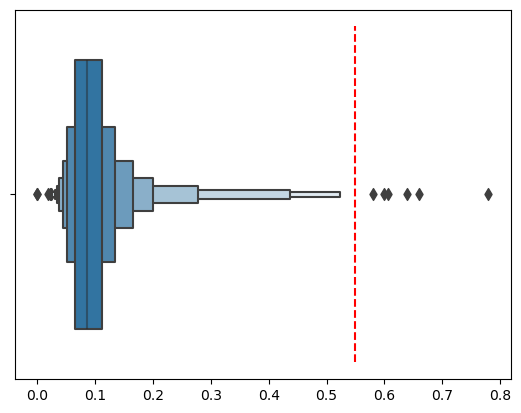

In [23]:
sns.boxenplot(x=data.away_turnovers/data.away_throws)
plt.plot([0.55,0.55], plt.ylim(),'r--')
plt.show()

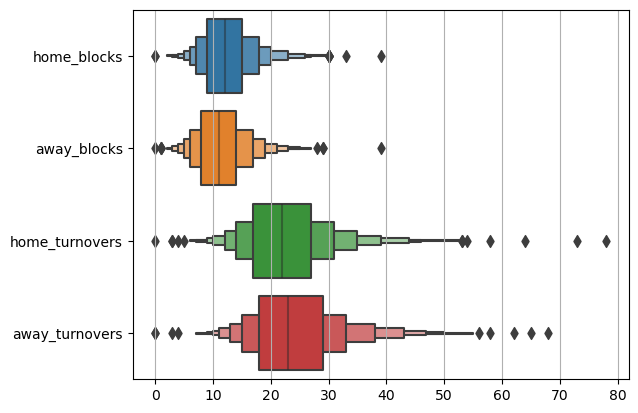

In [57]:
sns.boxenplot(data.iloc[:,10:14], orient='h')
#plt.xscale('log')
ylim = plt.ylim()
plt.grid(axis='x')
plt.show()

#### Cleaning Investigations

*length section, I tried to keep it organized. Data checks follow sequentially.*

For example, more than `X` suspect games may have been found for a check performed at step 5, if it were instead performed at step 2.


 - **Throws >= Completions**
   - 4 games do not match the strciter criteria, `throws > completions`
     - `Index([1900, 1972, 1977, 2021], dtype='int64')`
   - 3/4 have `throws=completions`, which means a team completed all of their throws. an impressive feat
     - if the team with all throws complete has 0 turnovers, this makes the data appear more valid
     - but what if the other team has blocks? all team's blocks are > 10 for these games
       - checked further below . . .
   - other game, `1900`, has completions > throws, may be reasonable to simply swap values
 - **Throws - Completions ~ other Blocks + Turnovers**
   - games on line are have home or away blocks = 0, seem valid as all opposing team's turnovers and incomplete throws
     - `data[(data.home_throws - data.home_completions == data.away_blocks + data.home_turnovers)]`
     - `data[(data.away_throws - data.away_completions == data.home_blocks + data.away_turnovers)]`
     - `data[data.home_blocks==0]` or `data[data.away_blocks==0]`
   - games outside normal bounds, `[1902, 1904, 1946]`
     - all 2012 home wins, all for home turnovers: 
       - `data[(data.home_throws - data.home_completions > data.away_blocks + data.home_turnovers)]`
     - can't make too much sense of the data or obvious errors. statistics indicate a home win would be surprising
     - will drop these games
  - **Turnover Outliers (>60)**
    - 5 games over 3 seasons
    - all high turnover teams have turnovers >= incomplete passes, `throws-completions`
      - could make case for subtracting opposing blocks from turnovers to make numbers seem more reasonable
      - seems to artificial, and it would be unfair to treat these games differently
    - will note for now and examine if they
  - **Low Completion Rates (Throws/Completions > 3)**
    - 2 games, one home and one away
    - **home game**: found bigger set of games with issue, all completed passes are scores
      - `data[data.home_score == data.home_completions]`
        - all for Cascades home games in 2015,2016
      - `data[data.away_completions == data.away_score]`
        - 2 games
      - I would guess not all throws were tracked, or only throws that were attempted scores.
      - will drop
    - **away game**
      - seems more reasonable, but still just one more completion than score
  - **Imbalanced Stat Keeping? one teams throws > 6x other's**
    - `ata[(data.home_throws/data.away_throws >= 6) | (data.away_throws/data.home_throws >= 6)]\`
    - found variety of issues with the following games, will drop
    - `[1518, 1413, 1366, 2012, 1594, 1390, 1818]`
  - **Improbably Scoring Rates (Scores/Completions ~ 1)**
    - 8 games found, will be dropped
    - more likely that not all throws tracked than real data, one obviously bogus game
      - `data[
    (data.away_score/data.away_completions > 0.9) | 
    (data.home_score/data.home_completions > 0.9)
]`
  - **Previously identified bad data - bogus score statistics**
    - remaining features seem fine, will keep

----

##### Throws > Completions Check

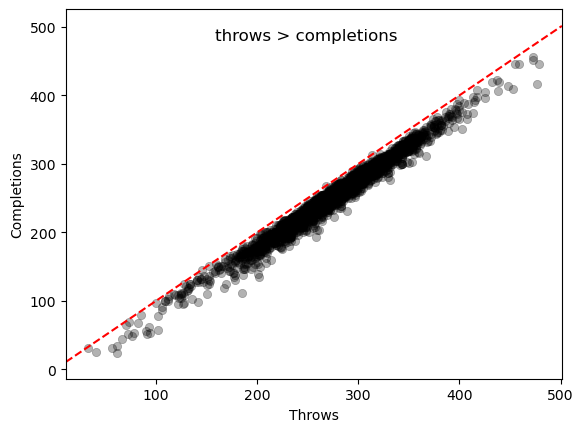

In [55]:
sns.scatterplot(x = data.home_throws, y=data.home_completions, alpha=0.3, color='k', edgecolor='face')
sns.scatterplot(x = data.away_throws, y=data.away_completions, alpha=0.3, color='k', edgecolor='face')
plt.suptitle('throws > completions', y=0.84)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('Throws')
plt.ylabel('Completions')
plt.show()

In [30]:
data[(data.home_completions >= data.home_throws) | (data.away_completions >= data.away_throws)].T

,1900,1972,1977,2021
game,2012-04-28-PHS-RIR,2013-04-28-ROC-DC,2013-05-04-DC-NY,2013-06-16-ROC-TOR
date,2012-04-28 19:00:00+00:00,2013-04-28 15:00:00+00:00,2013-05-04 17:00:00+00:00,2013-06-16 14:00:00+00:00
home,Rampage,Breeze,Empire,Rush
away,Spinners,Dragons,Breeze,Dragons
home_score,22,26,25,25
away_score,30,25,11,22
home_completions,204,313,246,244
away_completions,182,175,268,145
home_throws,191,313,267,264
away_throws,205,196,268,145


##### Overall Turnovers Check
*incompletions, turnovers, blocks*

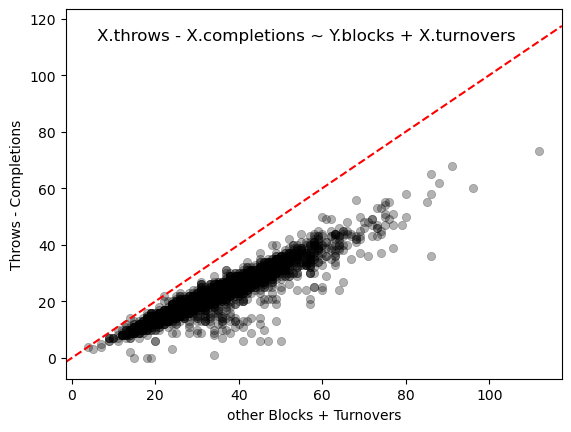

In [56]:
sns.scatterplot(x = data.away_blocks + data.home_turnovers, y=data.home_throws-data.home_completions,
                alpha=0.3, color='k', edgecolor='face')
sns.scatterplot(x = data.home_blocks + data.away_turnovers, y=data.away_throws-data.away_completions,
                alpha=0.3, color='k', edgecolor='face')
plt.suptitle('X.throws - X.completions ~ Y.blocks + X.turnovers', y=0.84)
#plt.suptitle('', y=0.82)
xlim = plt.xlim()
plt.plot(xlim,xlim, 'r--')
plt.xlim(xlim)
plt.xlabel('other Blocks + Turnovers')
plt.ylabel('Throws - Completions')
plt.show()

In [14]:
print('home')
data[(data.home_throws - data.home_completions > data.away_blocks + data.home_turnovers)].T

home


""
game
date
home
away
home_score
away_score
home_completions
away_completions
home_throws
away_throws


In [105]:
# check = data[(data.home_throws - data.home_completions > data.away_blocks + data.home_turnovers)]
# check.loc[:,'home_incomplete'] = data.home_throws - data.home_completions
# check.loc[:,'home_to_away_block'] = data.away_blocks + data.home_turnovers
# check.loc[:,'away_incomplete'] = data.away_throws - data.away_completions
# check.loc[:,'away_to_home_block'] = data.home_blocks + data.away_turnovers
# check.T

##### Low Completion Rates

In [37]:
data[(data.home_throws/data.home_completions >= 3) | (data.away_throws/data.away_completions >= 3)].T

,2075
game,2014-04-26-CIN-CHI
date,2014-04-26 19:00:00+00:00
home,Union
away,Revolution
home_score,27
away_score,12
home_completions,212
away_completions,13
home_throws,243
away_throws,59


In [41]:
data[data.away_completions == data.away_score].T

""
game
date
home
away
home_score
away_score
home_completions
away_completions
home_throws
away_throws


##### Imbalanced Stat Keeping??
*For low team, check throws vs completions vs score*

 - maybe ok?
   - 1968, 1748
 - maybe not ok? *one more completion than score*
   - 1518, 1413, 1366
   - would seem better if blocks added to throws
 - bad
   - 2012, 1594, 1390, 1818 *cascades home game*

In [40]:
data[(data.home_throws/data.away_throws >= 6) | (data.away_throws/data.home_throws >= 6)]\
.T

,1968,1748
game,2013-04-27-MAD-MIN,2015-06-27-OTT-MTL
date,2013-04-27 20:00:00+00:00,2015-06-27 19:00:00+00:00
home,Wind Chill,Royal
away,Radicals,Outlaws
home_score,20,25
away_score,22,29
home_completions,31,31
away_completions,287,335
home_throws,33,56
away_throws,308,355


##### Outlier Scoring Rates (Scores/Completions)
 - most clear to simply drop any with score/completion > 0.9
 - some shaky games dropped in previous steps

In [42]:
data[data.away_score/data.away_completions > 1]

,game,date,home,away,home_score,away_score,home_completions,away_completions,home_throws,away_throws,home_blocks,away_blocks,home_turnovers,away_turnovers,home_win,home_margin
1973,2013-04-28-TOR-NJH,2013-04-28 16:00:00+00:00,Hammerheads,Rush,19,29,229,27,253,45,9,20,36,27,False,-10


In [47]:
data[data.away_score/data.away_completions > 0.9].T

,1973,2062,2075,2166,1850
game,2013-04-28-TOR-NJH,2014-04-12-VAN-SLC,2014-04-26-CIN-CHI,2014-07-05-DET-CIN,2015-05-02-OTT-ROC
date,2013-04-28 16:00:00+00:00,2014-04-12 19:00:00+00:00,2014-04-26 19:00:00+00:00,2014-07-05 19:00:00+00:00,2015-05-02 18:30:00+00:00
home,Hammerheads,Lions,Union,Revolution,Dragons
away,Rush,Riptide,Revolution,Mechanix,Outlaws
home_score,19,14,27,24,18
away_score,29,29,12,20,24
home_completions,229,209,212,214,211
away_completions,27,32,13,21,25
home_throws,253,247,243,239,238
away_throws,45,49,59,50,45


In [46]:
data[data.home_score/data.home_completions > 0.9].T

,1815,1796,1629
game,2015-05-23-VAN-SEA,2015-05-31-LA-SF,2016-05-20-SJ-SEA
date,2015-05-23 18:00:00+00:00,2015-05-31 13:00:00+00:00,2016-05-20 19:00:00+00:00
home,Cascades,FlameThrowers,Cascades
away,Riptide,Aviators,Spiders
home_score,34,24,27
away_score,27,17,17
home_completions,35,26,28
away_completions,241,247,222
home_throws,53,48,46
away_throws,267,277,252


In [51]:
data[data.home=='Cascades'][['date','home_score', 'home_completions', 'home_throws']]

,date,home_score,home_completions,home_throws
2078,2014-04-26 19:00:00+00:00,13,286,320
2100,2014-05-11 19:00:00+00:00,14,332,368
2118,2014-05-25 19:00:00+00:00,16,272,302
2135,2014-06-08 19:00:00+00:00,35,262,288
2153,2014-06-22 19:00:00+00:00,14,254,278
2173,2014-07-12 19:00:00+00:00,18,211,239
1879,2015-04-18 19:30:00+00:00,20,221,244
1842,2015-05-09 19:30:00+00:00,19,53,78
1815,2015-05-23 18:00:00+00:00,34,35,53
1747,2015-06-28 14:00:00+00:00,27,269,291


##### Turnover Outliers
 - high turnovers, low throws. should result in loss
   - *true for home game* `1708`
 - many high away turnover rates dropped in previous step (imbalanced stat keeping, low number of throws)
   - remaining away game `2066`, could be fine but will drop.
   - looks again like one that would be better if opposing blocks were added to throws.

In [58]:
data[(data.home_turnovers >= 60) & (data.home_throws < 200)].T

,1708
game,2016-04-02-DET-CIN
date,2016-04-02 19:30:00+00:00
home,Revolution
away,Mechanix
home_score,12
away_score,15
home_completions,112
away_completions,134
home_throws,185
away_throws,202


In [59]:
data[(data.away_turnovers/data.away_throws > 0.55)].T

,2066
game,2014-04-13-VAN-SLC
date,2014-04-13 19:00:00+00:00
home,Lions
away,Riptide
home_score,12
away_score,21
home_completions,207
away_completions,24
home_throws,257
away_throws,61


##### Previously Found Bad Data

Original data cleaning found a few games (listed by index) with bogus score data. A team's o/d scores did not add up to their total. 
These games were checked again below, and seem to be ok.

In [62]:
# check for previously found bad data
data.loc[[1641, 1525, 2353, 2964, 2095],:].T

,1641,1525,2353,2964,2095
game,2016-05-14-CHI-MIN,2016-07-10-RAL-AUS,2018-07-14-DET-PIT,2022-11-12-allstar-game,2014-05-10-MIN-IND
date,2016-05-14 19:00:00+00:00,2016-07-10 12:30:00+00:00,2018-07-14 18:00:00+00:00,2022-11-12 16:00:00+00:00,2014-05-10 19:00:00+00:00
home,Wind Chill,Sol,Thunderbirds,SW All-Stars,AlleyCats
away,Union,Flyers,Mechanix,EC All-Stars,Wind Chill
home_score,26,33,32,24,25
away_score,23,12,10,42,24
home_completions,258,267,190,264,100
away_completions,173,104,190,241,367
home_throws,280,296,208,294,109
away_throws,186,125,209,262,389


----
#### Cleaning Descisions
 - swap home throws/completions for `1900`
 - drop games bad home data, turnovers/blocks/incompletions don't add up: `[1902, 1904, 1946]`
 - suspect home stats for some Cascades games, 
   - `data[data.home_completions==data.home_score]`
 - similarly, games with imbalanced stats for home and away, probably incomplete tracking, 
   - `data[(data.home_throws/data.away_throws >= 6) | (data.away_throws/data.home_throws >= 6)]`
 - improbable score rates, could be indicative of incomplete tracking
    - `data[(data.away_score/data.away_completions > 0.9) | (data.home_score/data.home_completions > 0.9)]`
 - turnover outliers

In [9]:
# one game throw/completion swap
print(data.loc[1900,'home_throws'], data.loc[1900,'home_completions'])
data.loc[1900,'home_throws'] = 204
data.loc[1900,'home_completions'] = 191

(191, 204)

In [10]:
# stats don't add up, games drop
data.drop(index=[1902, 1904, 1946], inplace=True)

In [11]:
# poorly kept home statistics (Cascades circa 2015-2016), worst offenders drop 
data.drop(index=data[data.home_completions==data.home_score].index, inplace=True)

In [12]:
# imbalanced state keeping
data.drop(index=[1518, 1413, 1366, 2012, 1594, 1390, 1818], inplace=True)

In [34]:
# outlier score rate, incomplete throw and/or completion tracking?
score_rate_drop = data[
    (data.away_score/data.away_completions > 0.9) | 
    (data.home_score/data.home_completions > 0.9)
].index
data.drop(index=score_rate_drop, inplace=True)

In [54]:
# turnover outlier(s)
data.drop(index=2066, inplace=True)

### Feature Engineering

 - plan for features with stronger correlations to targets than existing features
 - add features
 - show distributions and correlations
   - outliers?
   
**Findings**
 - outliers analysis needed for comp rate difference, at least
 - engineered features show stronger relationships, as should be expected
 - some collinearity introduced as a result of engineered features' definitions
   - will consider when modeling
 - feature importance will be further assessed in the next section

In [67]:
data.shape

(1521, 16)

In [71]:
# Correlation Table for target features
data.corr(numeric_only=True).iloc[-2:,2:-2].T.style\
        .background_gradient(cmap = 'PiYG', vmin=-1,vmax=1)\
        .format(formatter="{:.3f}")

,home_win,home_margin
home_completions,0.032,-0.001
away_completions,-0.030,-0.021
home_throws,-0.021,-0.057
away_throws,0.024,0.059
home_blocks,0.373,0.523
away_blocks,-0.395,-0.423
home_turnovers,-0.340,-0.358
away_turnovers,0.345,0.501


In [ ]:
sns.boxenplot(data.iloc[:,6:10], orient='h')
#plt.xscale('log')
ylim = plt.ylim()
plt.grid(axis='x')
plt.show()

In [ ]:
sns.boxenplot(data.iloc[:,10:14], orient='h')
#plt.xscale('log')
ylim = plt.ylim()
plt.grid(axis='x')
plt.show()

#### Exploration
- what seems useful?
  - does it provide value over input features? roughly estimate via correlation coefficient
  - in addition to correlation and relationships with target variables, distributions were assessed
  - tried various combinations, ratios, differences
    - *could try to further transform things like completion rate*
- various graphs and numbers presented without detailed commentary

##### Correlation Printouts

*lots of crude comparisons*

In [72]:
data.columns

Index(['game', 'date', 'home', 'away', 'home_score', 'away_score',
       'home_completions', 'away_completions', 'home_throws', 'away_throws',
       'home_blocks', 'away_blocks', 'home_turnovers', 'away_turnovers',
       'home_win', 'home_margin'],
      dtype='object')

In [73]:
print('HOME')
print('home blocks')
print(data.home_margin.corr(data.home_blocks))
print('away turnovers')
print(data.home_margin.corr(data.away_turnovers))
print('sum')
print(data.home_margin.corr(data.home_blocks+data.away_turnovers))
print('product')
print(data.home_margin.corr(data.home_blocks*data.away_turnovers))

HOME
home blocks
0.5228343468799803
away turnovers
0.5005998681136246
sum
0.5420293274194027
product
0.5376956979615062


In [91]:
print('turnover difference (home - away)')
print(data.home_margin.corr(data.home_turnovers-data.away_turnovers))
print('block difference (away - home)')
print(data.home_margin.corr(data.away_blocks-data.home_blocks))
print('turnover and block difference')
print(data.home_margin.corr((data.home_turnovers+data.away_blocks)-(data.away_turnovers+data.home_blocks)))

turnover difference (home - away)
-0.8904180577323116
block difference (away - home)
-0.7295766883530839
turnover and block difference
-0.9103412378521454


In [74]:
data.home_margin.corr(np.exp(data.home_blocks))

0.03933923612934116

In [77]:
data.home_margin.corr(data.home_turnovers-data.away_turnovers)

-0.8904180577323116

In [78]:
data.home_margin.corr(data.home_blocks-data.away_blocks)

0.7295766883530839

In [102]:

print('home completion rate')
print(data.home_margin.corr((data.home_completions/data.home_throws)))

print('away completion rate')
print(data.home_margin.corr((data.away_completions/data.away_throws)))

print('completion rate difference')
print(data.home_margin.corr((data.home_completions/data.home_throws)-(data.away_completions/data.away_throws)))

# print('completion rate difference')
# print(data.home_margin.corr((data.home_completions/data.home_throws)-(data.away_completions/data.away_throws)))

home throws
-0.05683154189757943
home completion rate
0.2743269470108473
away throws
0.05915440452220447
away completion rate
-0.33295517884026227
completion rate difference
0.5540177230086538


In [121]:

print('home turnovers, turnover rate')
print(data.home_margin.corr(data.home_turnovers))
print(data.home_margin.corr((data.home_turnovers/data.home_throws)))

print('away turnovers, turnover rate')
print(data.home_margin.corr(data.away_turnovers))
print(data.home_margin.corr((data.away_turnovers/data.away_throws)))

#print('completion rate difference')
#print(data.home_margin.corr((data.home_completions/data.home_throws)-(data.away_completions/data.away_throws)))

# print('completion rate difference')
# print(data.home_margin.corr((data.home_completions/data.home_throws)-(data.away_completions/data.away_throws)))

home turnovers, turnover rate
-0.35809724155876116
-0.274117332014134
away turnovers, turnover rate
0.5005998681136246
0.32546011267956415


##### Graphs
*visual assessment with target features for promising cadidates and original features*

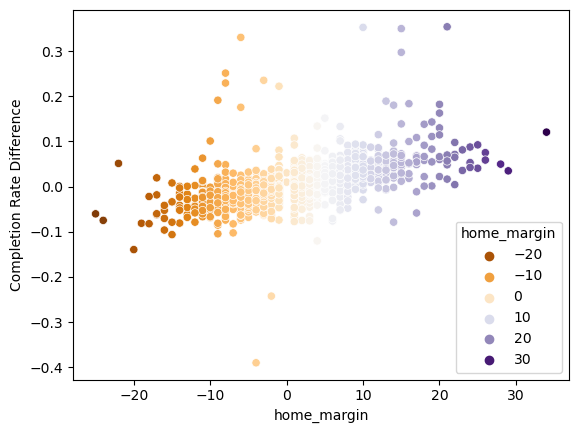

In [111]:
sns.scatterplot(y=(data.home_completions/data.home_throws)-(data.away_completions/data.away_throws), 
                               x=data.home_margin, hue=data.home_margin, palette='PuOr')
plt.ylabel('Completion Rate Difference')
plt.show()

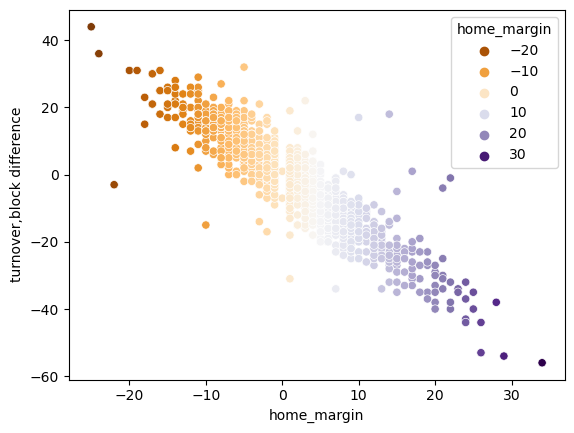

In [107]:
sns.scatterplot(y=(data.home_turnovers+data.away_blocks)-(data.away_turnovers+data.home_blocks),
                x=data.home_margin, hue=data.home_margin, palette='PuOr')
plt.ylabel('turnover,block difference')
plt.show()

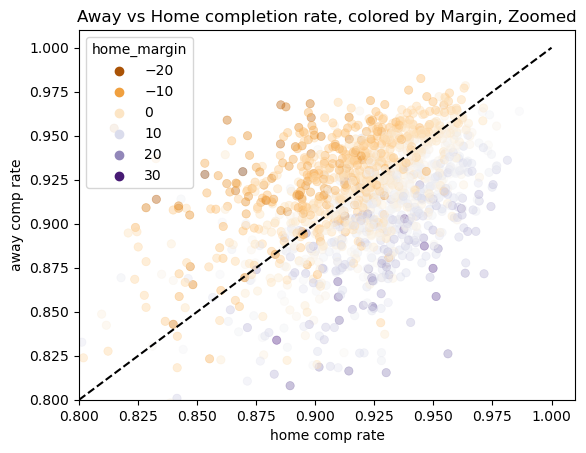

In [54]:
sns.scatterplot(x=data.home_completions/data.home_throws, y=data.away_completions/data.away_throws,
            hue=data.home_margin, edgecolor='face', alpha=0.4, palette='PuOr')
plt.xlabel('home comp rate')
plt.ylabel('away comp rate')
plt.plot([0.8,1],[0.8,1],'k--')
plt.xlim(0.8,1.01)
plt.ylim(0.8,1.01)
plt.title('Away vs Home completion rate, colored by Margin, Zoomed')
plt.show()

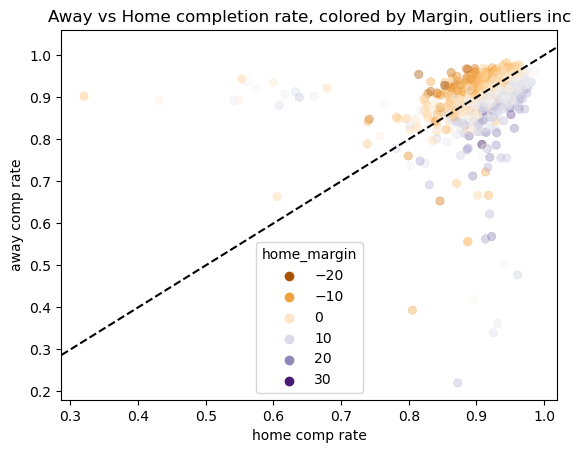

In [55]:
sns.scatterplot(x=data.home_completions/data.home_throws, y=data.away_completions/data.away_throws,
            hue=data.home_margin, edgecolor='face', alpha=0.4, palette='PuOr')
plt.xlabel('home comp rate')
plt.ylabel('away comp rate')
xlim = plt.xlim()
plt.plot(xlim,xlim, 'k--')
plt.xlim(xlim)
plt.title('Away vs Home completion rate, colored by Margin, outliers inc')
plt.show()

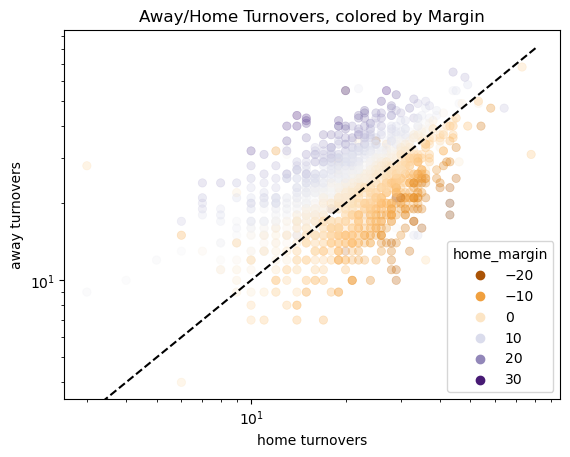

In [118]:
sns.scatterplot(x=data.home_turnovers, y=data.away_turnovers,
            hue=data.home_margin, edgecolor='face', alpha=0.3, palette='PuOr')
xlim = plt.xlim()
plt.plot(xlim,xlim, 'k--')
#plt.xlim(xlim)
plt.xlabel('home turnovers')
plt.ylabel('away turnovers')
plt.xscale('log')
plt.yscale('log')
plt.title('Away/Home Turnovers, colored by Margin')
plt.show()

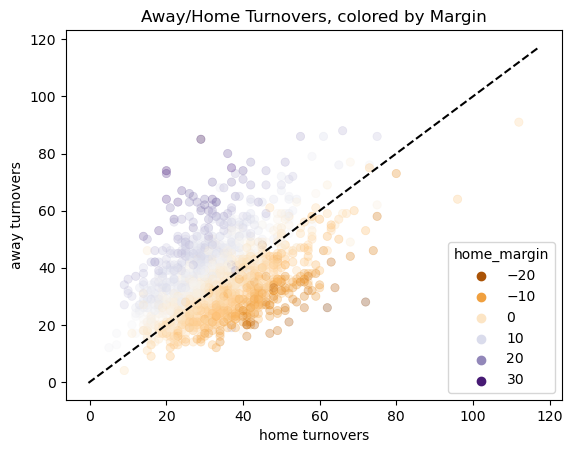

In [125]:
sns.scatterplot(x=data.home_turnovers+data.away_blocks, y=data.away_turnovers+data.home_blocks,
            hue=data.home_margin, edgecolor='face', alpha=0.3, palette='PuOr')
xlim = plt.xlim()
plt.plot(xlim,xlim, 'k--')
#plt.xlim(xlim)
plt.xlabel('home turnovers')
plt.ylabel('away turnovers')
# plt.xscale('log')
# plt.yscale('log')
plt.title('Away/Home Turnovers, colored by Margin')
plt.show()

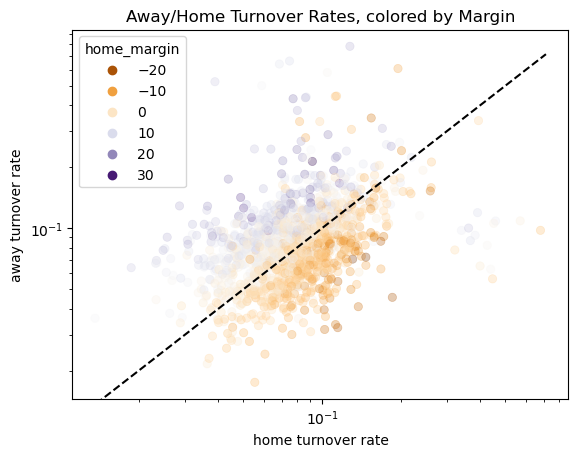

In [57]:
sns.scatterplot(x=data.home_turnovers/data.home_throws, y=data.away_turnovers/data.away_throws,
            hue=data.home_margin, edgecolor='face', alpha=0.3, palette='PuOr')
xlim = plt.xlim()
plt.plot(xlim,xlim, 'k--')
#plt.xlim(xlim)
plt.xlabel('home turnover rate')
plt.ylabel('away turnover rate')
plt.xscale('log')
plt.yscale('log')
plt.title('Away/Home Turnover Rates, colored by Margin')
plt.show()

#### Engineered Features

- create
- re-assess distributions, correlations, intercorrelations, *outliers:*
  - turnover difference outliers seem reasonable --> blowout victories
    - `data[data['block_turnover_diff'].abs()>40].T`
  - comp rate difference outliers: half seem ok, half might be bad stat keeping (low throws recorded). will keep
    - `data[data['comp_rate_diff'].abs()>0.3].T` 

In [126]:
# comp %
data['home_completion_rate'] = data.home_completions / data.home_throws
data['away_completion_rate'] = data.away_completions / data.away_throws

# aggregate differences
data['comp_rate_diff'] = data.home_completion_rate-data.away_completion_rate
data['block_turnover_diff'] = (data.away_turnovers+data.home_blocks) - (data.home_turnovers+data.away_blocks)

In [135]:
# drop and re-add target features for easier indexing
data.drop(columns=['home_win','home_margin'], inplace=True)
data.loc[:,'home_win'] = data.home_score > data.away_score
data.loc[:,'home_margin'] = data.home_score - data.away_score

In [136]:
data.columns

Index(['game', 'date', 'home', 'away', 'home_score', 'away_score',
       'home_completions', 'away_completions', 'home_throws', 'away_throws',
       'home_blocks', 'away_blocks', 'home_turnovers', 'away_turnovers',
       'home_completion_rate', 'away_completion_rate', 'comp_rate_diff',
       'block_turnover_diff', 'home_win', 'home_margin'],
      dtype='object')

In [138]:
# Correlation Table for target features
data.corr(numeric_only=True).iloc[-2:,:-2].T.style\
        .background_gradient(cmap = 'PiYG', vmin=-1,vmax=1)\
        .format(formatter="{:.3f}")

,home_win,home_margin
home_score,0.547,0.715
away_score,-0.533,-0.690
home_completions,0.032,-0.001
away_completions,-0.030,-0.021
home_throws,-0.021,-0.057
away_throws,0.024,0.059
home_blocks,0.373,0.523
away_blocks,-0.395,-0.423
home_turnovers,-0.340,-0.358
away_turnovers,0.345,0.501


In [125]:
data[data['comp_rate_diff'].abs()>0.3].T

,2158,1756,1748,1566,1535
game,2014-06-28-CIN-CHI,2015-06-22-MTL-ROC,2015-06-27-OTT-MTL,2016-06-19-PHI-NY,2016-07-09-PHI-OTT
date,2014-06-28 19:00:00+00:00,2015-06-22 18:30:00+00:00,2015-06-27 19:00:00+00:00,2016-06-19 18:30:00+00:00,2016-07-09 18:00:00+00:00
home,Union,Dragons,Royal,Empire,Outlaws
away,Revolution,Royal,Outlaws,Phoenix,Phoenix
home_score,21,17,25,28,37
away_score,11,23,29,13,16
home_completions,294,277,31,254,262
away_completions,51,34,335,53,58
home_throws,322,312,56,278,284
away_throws,91,61,355,94,102


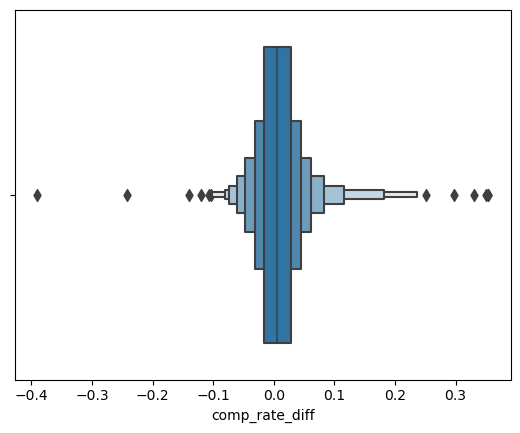

In [123]:
sns.boxenplot(x=data.comp_rate_diff)
plt.show()

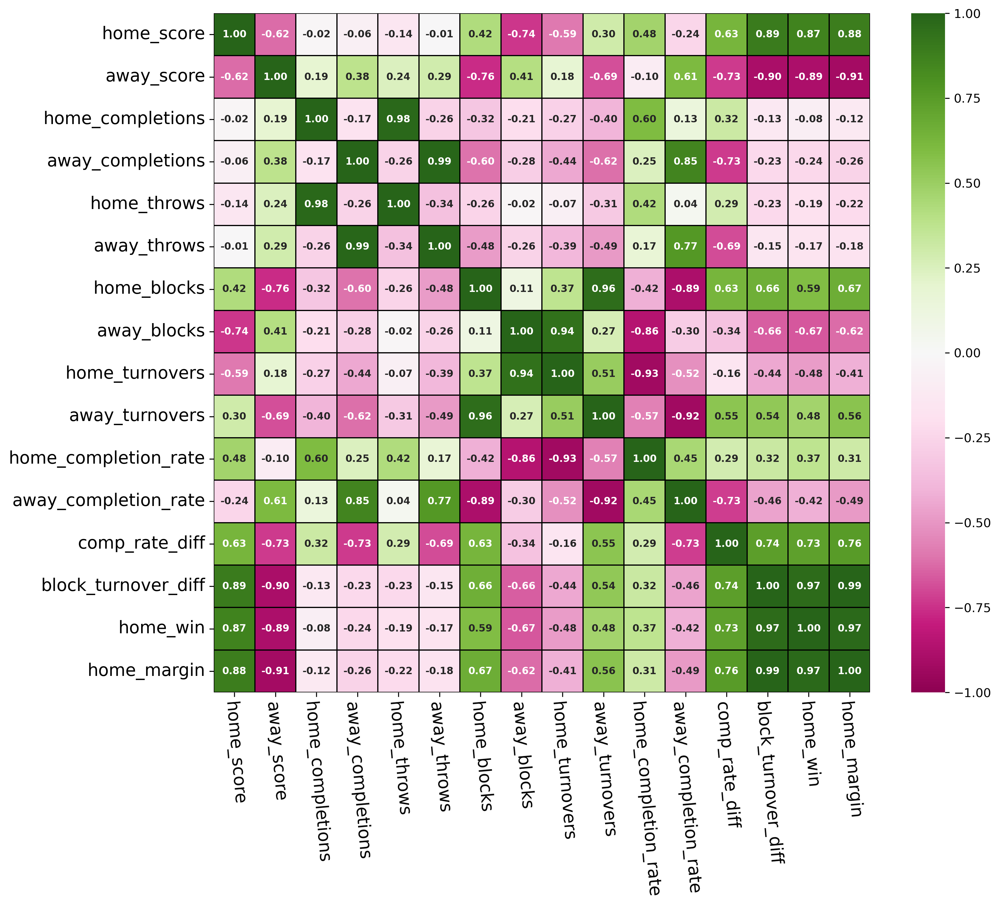

In [179]:
fig = plt.figure(figsize=(12,10), dpi=300)
sns.heatmap(data.corr(numeric_only=True).corr(), cmap='PiYG', linecolor='k', linewidths=0.5,
           vmin=-1, vmax=1,yticklabels=True, xticklabels=True,  fmt=".2f",
           annot=True, annot_kws=dict(fontsize=8,fontweight='bold'))
plt.tick_params(axis='x',labelrotation=-85)
plt.tick_params(axis='both',labelsize=14)
plt.savefig(Path('graphs/EDA/corr_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

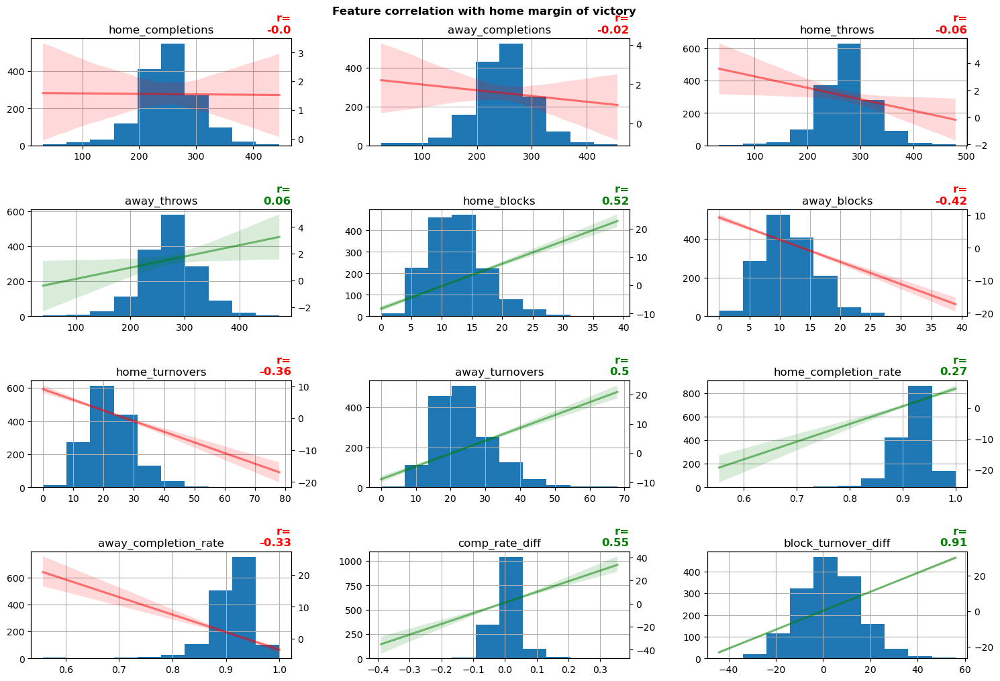

CPU times: total: 24.4 s
Wall time: 10.2 s


In [177]:
%%time

# all numerical feature except score
# distributions, reg fit vs home margin
x = data.iloc[:,6:-2].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            pearson = data[[param,'home_margin']].corr().iloc[0,1]
            # indicate positive / negative relationship with green / red
            c = 'g' if pearson > 0 else 'r' 
            sns.regplot(data, x=param, y='home_margin', scatter=False,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5))
            plt.title(f'r=\n{round(pearson,2)}', fontweight='bold', loc='right', color=c)
            plt.ylabel('')

plt.suptitle('Feature correlation with home margin of victory', y=0.92, fontweight='bold')
plt.savefig(Path('graphs/EDA/hist_vs_margin.png'), dpi=300, bbox_inches='tight')
plt.show()

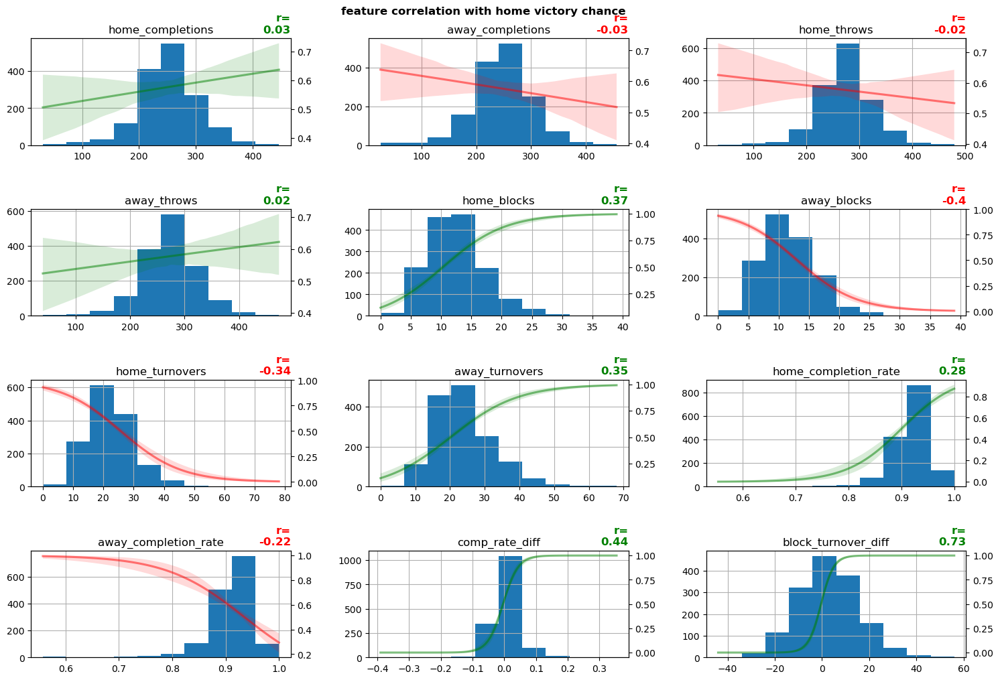

CPU times: total: 1min 14s
Wall time: 18.8 s


In [178]:
%%time
# all numerical feature except score
# distributions, reg fit vs home margin
# can adjust n_boot (default 1000) to decrease plotting time
# ex: try 250 for speed up
x = data.iloc[:,6:-2].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            pearson = data[[param,'home_win']].corr().iloc[0,1]
            # indicate positive / negative relationship with green / red
            c = 'g' if pearson > 0 else 'r' 
            sns.regplot(data, x=param, y='home_win', scatter=False, logistic=True,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5), n_boot=250)
            plt.ylabel('')
            plt.title(f'r=\n{round(pearson,2)}', fontweight='bold', loc='right', color=c)
plt.suptitle('feature correlation with home victory chance', y=0.92, fontweight='bold')

plt.savefig(Path('graphs/EDA/hist_vs_win.png'), dpi=300, bbox_inches='tight')
plt.show()

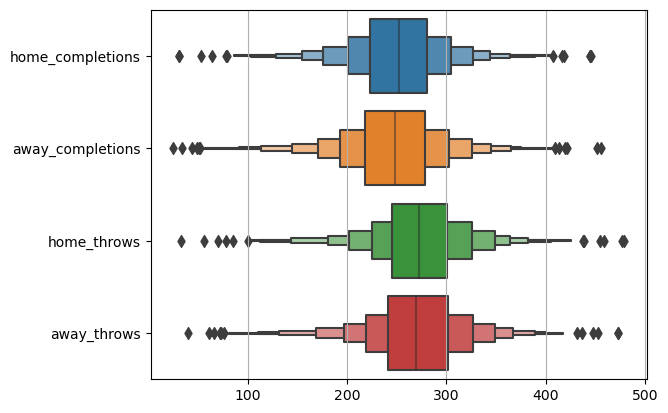

In [147]:
sns.boxenplot(data.iloc[:,6:10], orient='h')
plt.grid(axis='x')
plt.show()

C:\Users\Nish\AppData\Local\Temp\ipykernel_5660\2554479435.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forplot['block_turnover_diff (shifted)'] = data['block_turnover_diff'] - data['block_turnover_diff'].min()


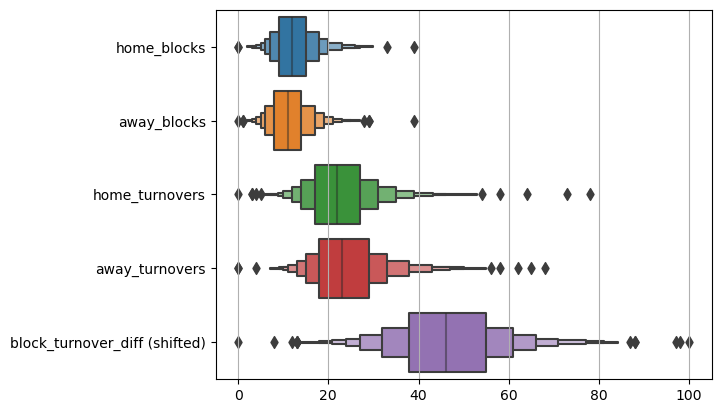

In [166]:
forplot = data[['home_blocks','away_blocks','home_turnovers','away_turnovers',]]
forplot['block_turnover_diff (shifted)'] = data['block_turnover_diff'] - data['block_turnover_diff'].min()

sns.boxenplot(forplot, orient='h')
plt.grid(axis='x')
plt.show()

C:\Users\Nish\AppData\Local\Temp\ipykernel_5660\1298387539.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forplot['comp_rate_diff (shifted)'] = data['comp_rate_diff'] - data['comp_rate_diff'].min()*2


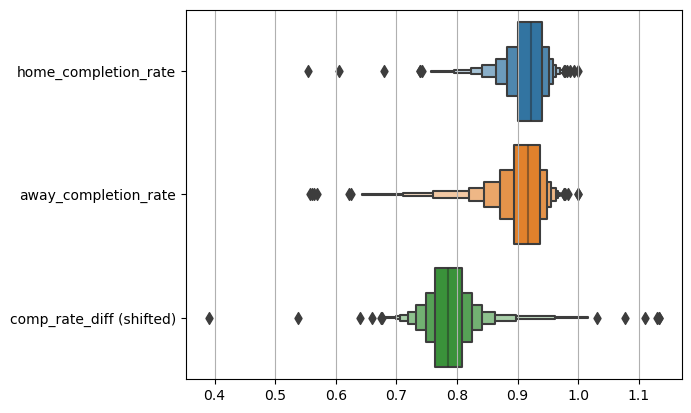

In [169]:
forplot = data[['home_completion_rate','away_completion_rate',]]

forplot['comp_rate_diff (shifted)'] = data['comp_rate_diff'] - data['comp_rate_diff'].min()*2

sns.boxenplot(forplot, orient='h')

plt.grid(axis='x')
plt.show()

C:\Users\Nish\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 3600x3000 with 0 Axes>

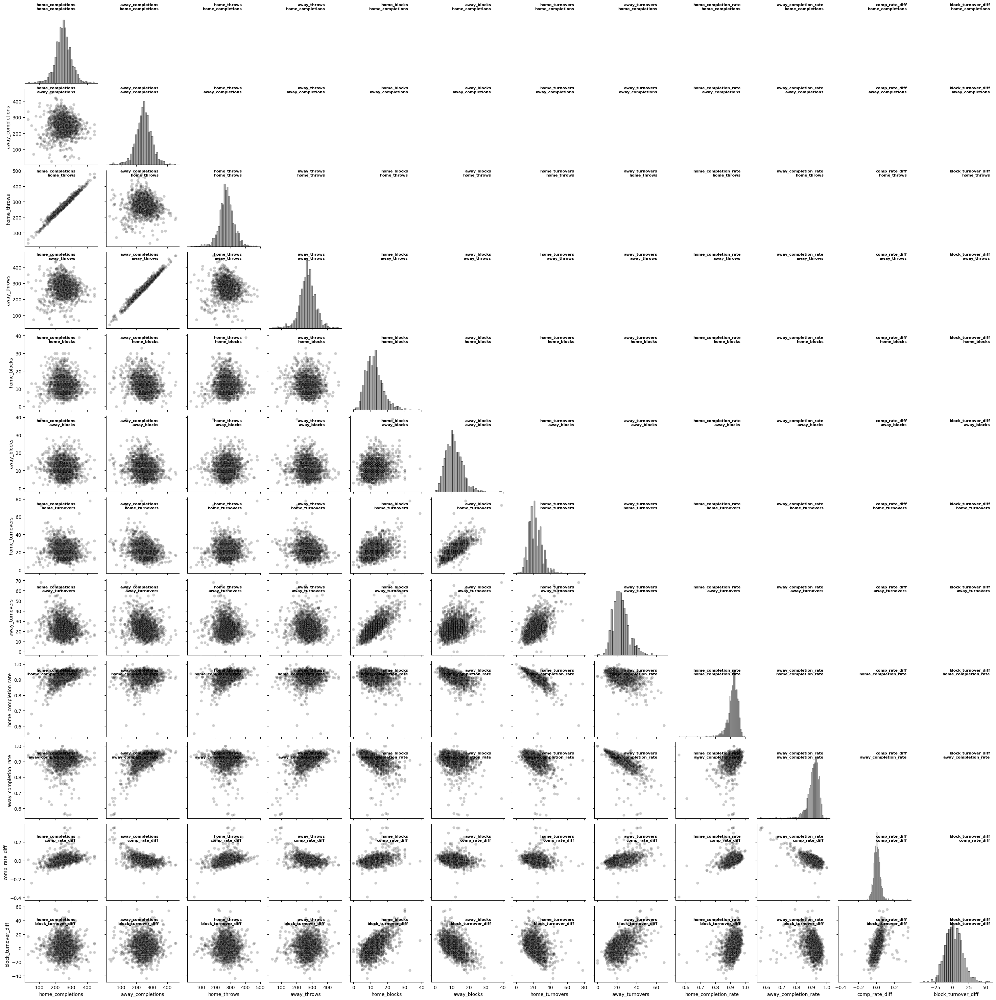

CPU times: total: 41.5 s
Wall time: 41.5 s


In [183]:
%%time
# basic feature pair plots, 20s to do columns 9:15
# columns 9:37, corner=True, figsize(12,10), dpi=300, takes > 8 mins 

# adjust column range as needed
i1=6 
i2=-2

# info for labels
cols = data.columns[i1:i2]
ylabels = list(cols)
ylabels.reverse()

# pairplot
fig = plt.figure(figsize=(12,10), dpi=300)
sns.pairplot(data.iloc[:,i1:i2], corner=True,
             plot_kws=dict(color='k', alpha=0.2),
             diag_kws=dict(color='grey'))

# positions for labels
xl = np.linspace(1/len(cols), .985, len(cols))
yl = np.linspace(1/(len(cols)), .985, len(cols))

# add labels
for x,x_lab in zip(xl,cols):
    for y,y_lab in zip(yl, ylabels):
        plt.gcf().text(x,y,f'{x_lab}\n{y_lab}', fontweight='bold', ha='right',
                      fontsize=8,)

plt.savefig(Path('graphs/EDA/pairplots/pairplot.png'), dpi=300, bbox_inches='tight')
plt.show()

##### Reduce image size of pairplots, marginally

Pillow function fills in the empty half of the image with black space.

In [103]:
from PIL import Image, ImageDraw
Image.MAX_IMAGE_PIXELS=None

In [105]:
%%time

images = {
    Path('graphs/EDA/pairplots/pairplot.png') : len(data.columns[6:-2]),
}

for plot in images.keys():
    with Image.open(plot) as im:
        features = images[plot]
        fill = ImageDraw.Draw(im)
        fill.polygon(
            [(im.width/features, 0), 
            (im.width, im.height - im.height/features),
            (im.width, 0)],
            fill = 'black',
        )
        im.save(Path(f'graphs/EDA/pairplots/chop_{plot.name}'))
    

CPU times: total: 6.05 s
Wall time: 6.04 s


### Save Data, Reload Final Clean

In [187]:
data.shape

(1521, 20)

In [185]:
data.to_parquet(Path('data/game_stats.parquet'))

In [118]:
data = pd.read_parquet(Path('data/game_stats.parquet'))

In [4]:
data.sample(3).T

,1849,1926,2273
game,2015-05-02-MTL-PHI,2012-06-16-IND-ROC,2018-05-26-PHI-TOR
date,2015-05-02 18:30:00+00:00,2012-06-16 19:00:00+00:00,2018-05-26 16:30:00+00:00
home,Phoenix,Dragons,Rush
away,Royal,AlleyCats,Phoenix
home_score,18,21,28
away_score,23,26,23
home_completions,276,177,225
away_completions,218,159,293
home_throws,306,188,245
away_throws,243,171,320


### Feature Importance

Briefly explore feature importance to get a sense of what will be important for modeling.

#### Feature Selection for Models

*Select KBest demonstration for both margin regression and win classification*

**Findings**
 - engineered features show better scores, as expected with correlation planning
 - two home-away difference stats very important
 - feature importance is similar for `home_margin` and `home_win`

In [25]:
from sklearn.feature_selection import SelectKBest, f_regression, f_classif, mutual_info_classif
from sklearn.preprocessing import scale, StandardScaler

In [6]:
data.columns[6:-2]

Index(['home_completions', 'away_completions', 'home_throws', 'away_throws',
       'home_blocks', 'away_blocks', 'home_turnovers', 'away_turnovers',
       'home_completion_rate', 'away_completion_rate', 'comp_rate_diff',
       'block_turnover_diff'],
      dtype='object')

In [18]:
X = data.iloc[:,6:-2]
y1 = data['home_margin']
y2 = data['home_win']

X = pd.DataFrame(scale(X), columns=X.columns)

In [19]:
sk1 = SelectKBest(f_regression, k='all')
sk1.fit(X,y1)

SelectKBest(k='all', score_func=<function f_regression at 0x000001ED01A2E680>)

In [31]:
pd.DataFrame(sk1.scores_, index=sk1.get_feature_names_out()).sort_values(0, ascending=False)

,0
block_turnover_diff,7349.579930
comp_rate_diff,672.715636
home_blocks,571.431472
away_turnovers,507.955514
away_blocks,331.873231
home_turnovers,223.439328
away_completion_rate,189.390748
home_completion_rate,123.615478
away_throws,5.334016
home_throws,4.922000


In [26]:
sk2 = SelectKBest(f_classif, k='all')
sk2.fit(X,y2)

SelectKBest(k='all',
            score_func=<function mutual_info_classif at 0x000001ED01A2CB80>)

In [24]:
pd.DataFrame(sk2.scores_, index=sk2.get_feature_names_out()).sort_values(0, ascending=False)

,0
block_turnover_diff,1714.039447
comp_rate_diff,372.950101
away_blocks,281.489295
home_blocks,245.315411
away_turnovers,205.624897
home_turnovers,198.546281
home_completion_rate,129.430508
away_completion_rate,76.685462
home_completions,1.554396
away_completions,1.395838


#### Demonstrative PCA

*What are feature contributions to PCA's reduced dimensions?*

**Findings**
 - 4 PCA features (data has 12) features needed to explain 90% of the variation
 - `throws` and `completions` have some contribution
   - PCA combinations of features achieve similar results to feature engineering?

In [32]:
from sklearn.decomposition import PCA#, TruncatedSVD
from sklearn.preprocessing import scale, StandardScaler

In [126]:
data.iloc[:,6:-2].shape

(1521, 12)

In [33]:
X = data.iloc[:,6:-2]
# y1 = data['home_margin']
# y2 = data['home_win']

X = pd.DataFrame(scale(X), columns=X.columns)

 # save for labelling
col_names = X.columns
#home_teams = data.loc[scaled_data_2.index,'home']

In [34]:
# fit pca
pca = PCA().fit(X)

In [38]:
pca_x = pca.transform(X)

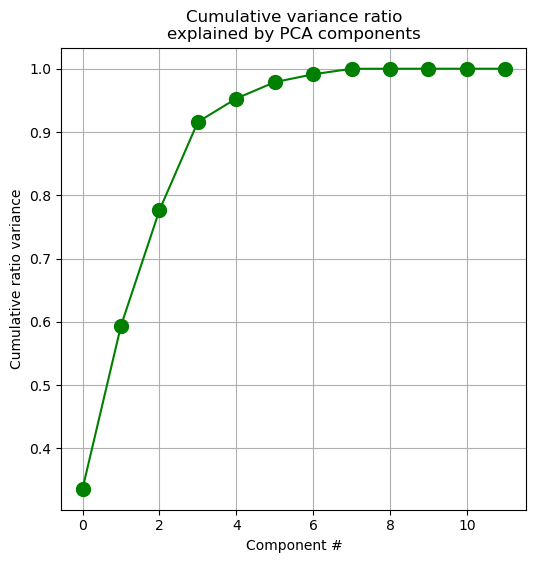

In [36]:
# plot explained variance cumulative sum
plt.subplots(figsize=(6, 6))
plt.plot(pca.explained_variance_ratio_.cumsum(), 'g-o', markersize=10)
plt.grid()
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio\nexplained by PCA components')
plt.savefig('graphs/EDA/PCA/Explained_variance_cumsum.png')
plt.show()

In [66]:
pd.DataFrame(pca.components_, columns=col_names).iloc[0:4,:].T.style\
    .background_gradient('PiYG', axis=None, vmin=-0.5, vmax=0.5)

,0,1,2,3
home_completions,-0.070871,-0.357462,-0.393895,-0.371223
away_completions,-0.329138,0.154278,0.250725,-0.438681
home_throws,-0.019562,-0.310958,-0.425425,-0.411373
away_throws,-0.270823,0.151172,0.293211,-0.493924
home_blocks,0.337490,-0.103891,0.267069,-0.291757
away_blocks,0.237258,0.311619,-0.288626,-0.219997
home_turnovers,0.346132,0.293782,-0.207789,-0.216194
away_turnovers,0.408459,-0.018095,0.250066,-0.256328
home_completion_rate,-0.295145,-0.423658,-0.026195,0.026138
away_completion_rate,-0.456441,0.127950,-0.030931,-0.040031


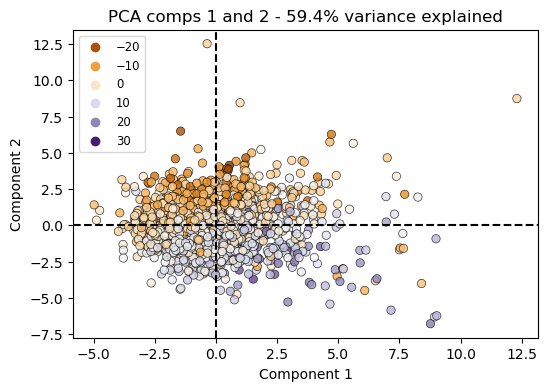

In [96]:
compA = 1
compB = 2

pc_var = round(100 * 
            (pca.explained_variance_ratio_[compA-1] 
             + pca.explained_variance_ratio_[compB-1])
               ,1)

a1 = pca_x[:, compA-1]
a2 = pca_x[:, compB-1]
#state = state_summary_index
#pc_var = 100 * pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(6,4))
sns.scatterplot(x=a1,y=a2, hue = y, 
                alpha=0.8, palette='PuOr', edgecolor='k')
plt.xlabel(f'Component {compA}')
plt.ylabel(f'Component {compB}')
plt.title(f'PCA comps {compA} and {compB} - {pc_var}% variance explained')

xb = plt.xlim()
yb = plt.ylim()

plt.plot(xb, [0,0], 'k--')
plt.plot([0,0],yb, 'k--')

plt.xlim(xb)
plt.ylim(yb)

plt.savefig(f'graphs/EDA/PCA/pca_scatter_{compA},{compB}.png')
plt.legend(fontsize='small')
plt.show()

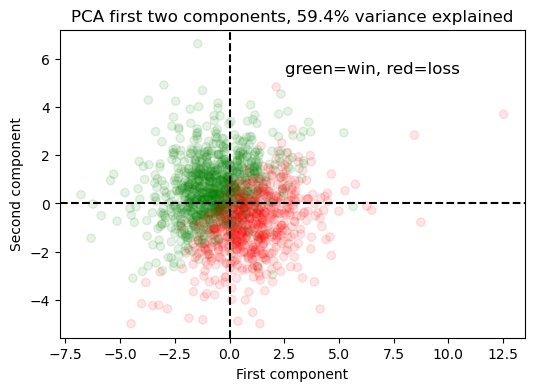

In [98]:
colors = ['g' if val else 'r' for val in data.home_win]
a1 = pca_x[:, 1]
a2 = pca_x[:, 2]
#state = state_summary_index
pc_var = 100 * pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(6,4))
plt.scatter(a1,a2, alpha=0.1, c=colors)

plt.suptitle('green=win, red=loss', y=0.8, ha='left')

plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'PCA first two components, {pc_var:.1f}% variance explained')

xb = plt.xlim()
yb = plt.ylim()

plt.plot(xb, [0,0], 'k--')
plt.plot([0,0],yb, 'k--')

plt.xlim(xb)
plt.ylim(yb)

plt.savefig(f'graphs/EDA/PCA/pca_scatter_home-win2.png')
plt.show()

In [76]:
components = 4
pca_contribution = pd.DataFrame(pca.components_, columns=col_names).iloc[0:components,:].T.abs()
pca_contribution = pd.DataFrame(pca_contribution.sum(axis=1)).rename(columns={0:'abs_first_4'})
pca_contribution.sort_values('abs_first_4', inplace=True)

In [72]:
pd.DataFrame(pca.components_, columns=col_names).iloc[0:components,:].T

,0,1,2,3
home_completions,-0.070871,-0.357462,-0.393895,-0.371223
away_completions,-0.329138,0.154278,0.250725,-0.438681
home_throws,-0.019562,-0.310958,-0.425425,-0.411373
away_throws,-0.270823,0.151172,0.293211,-0.493924
home_blocks,0.337490,-0.103891,0.267069,-0.291757
away_blocks,0.237258,0.311619,-0.288626,-0.219997
home_turnovers,0.346132,0.293782,-0.207789,-0.216194
away_turnovers,0.408459,-0.018095,0.250066,-0.256328
home_completion_rate,-0.295145,-0.423658,-0.026195,0.026138
away_completion_rate,-0.456441,0.127950,-0.030931,-0.040031


In [77]:
pca_contribution.sort_values('abs_first_4',ascending=False)

,abs_first_4
away_throws,1.209130
home_completions,1.193451
away_completions,1.172823
home_throws,1.167318
home_turnovers,1.063897
away_blocks,1.057499
block_turnover_diff,1.017501
home_blocks,1.000208
away_turnovers,0.932948
home_completion_rate,0.771136


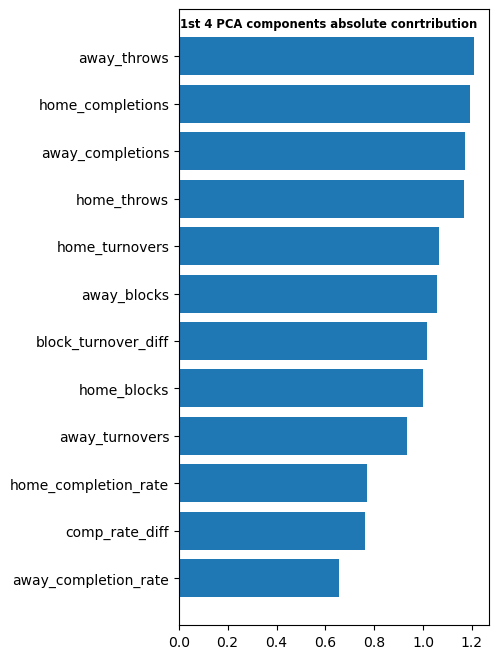

In [78]:
fig = plt.figure(figsize=(4,8), dpi=100)
plt.barh(y=pca_contribution.index, width = [val[0] for val in pca_contribution.values])
plt.suptitle('1st 4 PCA components absolute conrtribution', fontsize='small', fontweight='bold', y = 0.87)
#plt.savefig('graphs/EDA/PCA/Feature_PCA-component_contribution.png')
plt.show()

### Conclusions

The initial dataset is now ready for early modeling efforts. More features may be included in later efforts for models with different problem statements.

A quick feature importance study found that a limited selection of the final features should be good for regression models, and indicates that the engineered features will help model performance.

Prior to this notebook, I engineered features with the entire dataset (before selecting features). Some of those graphs are retained in the repository.
See: `/graphs/EDA/feature_engineering_0/`

### Other
#### plotly heatmaps
*ydata report not included*

In [107]:
# plotly
import plotly.express as px


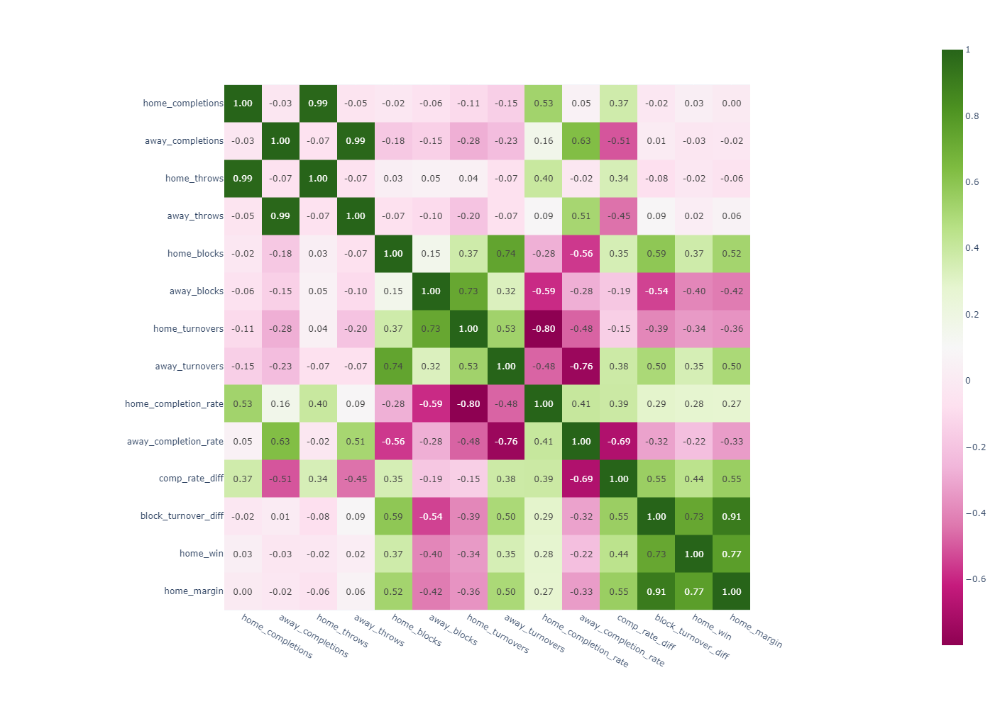

In [116]:
fig = px.imshow(data.iloc[:,6:].corr(), text_auto=".2f", color_continuous_scale='PiYG',
               )
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Helvetica"
        
    ),
)

fig.write_html('graphs/EDA/plotly HTML figures/plotly_heatmap.html')
fig.update_layout(width=1000,height=1000)
fig.show()

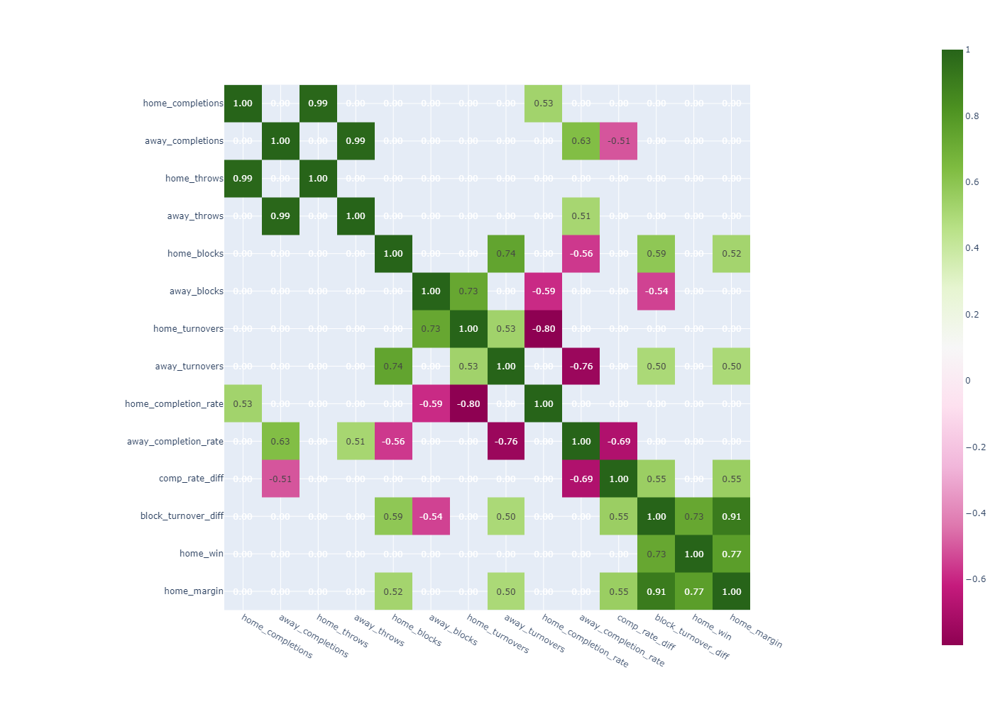

In [114]:
fig = px.imshow(data.iloc[:,6:].corr()[abs(data.iloc[:,6:].corr()) >=0.5], text_auto=".2f", color_continuous_scale='PiYG',
               )
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Helvetica"
        
    ),
)

fig.write_html('graphs/EDA/plotly HTML figures/plotly_heatmap_focused.html')
fig.update_layout(width=1000,height=1000)
fig.show()